## **Aplicação HRNet**

In [1]:
import sys
sys.path.append('../../')

In [2]:
import matplotlib.pyplot as plt
import os
import cv2 as cv
import numpy as np
import json
from pathlib import Path
import pandas as pd
from typing import Dict, List, Tuple, Callable

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms as T
from torch.utils.data import DataLoader
from tqdm import tqdm
import torch.optim as optim
import optuna
import kornia
import seaborn as sns
from scipy.stats import pearsonr

# Importar sua classe existente
from notebooks.playground_VC.hrnet_light.hrnet_light_roi import HRNet
from src.vfss_dataset import VFSSImageDataset
from src.utils import get_script_relative_path, get_project_root_directory
from src.data_extraction.video_frame import create_video_frame_df, load_video_frame_metadata_from_csv
from src.split_data import split_data_k_fold
from src.utils import get_corners_from_angle
from src.target.heatmap import generate_heatmap_from_points
from src.utils import plot_image_with_mask

In [3]:
# UTILS
# =======================================

def clahe(img):
    img_clahe = kornia.enhance.equalize_clahe(img, clip_limit = 5.0)#, clip_limit=20.0, grid_size=(8, 8))
    return img_clahe

def modify_input(img):
    # Padroniza tudo para o formato (batch, filtro, H, W)
    if (len(img.shape) != 4):
        img = img.unsqueeze(0) 
    
    # Modifica cada uma das imagens
    list_imgs = []
    n_batch = img.shape[0]
    for i in range(n_batch):
        img_orig = img[i][0] # (filtro, H, W)

        # Aplica CLAHE
        img_clahe = clahe(img_orig)

        # Aplica Double CLAHE
        img_double_clahe = clahe(img_clahe)

        # Stack Channels
        img_channels = torch.stack([img_orig, img_clahe, img_double_clahe])

        # Stack Batch
        list_imgs.append(img_channels)

    img_new = torch.stack(list_imgs, dim = 0)
    
    return img_new

def custom_collate_fn(batch):
    """
    batch é uma lista de tuplas: [(frame, target_dict, meta), (frame, target_dict, meta), ...]
    """
    frames = torch.stack([item[0] for item in batch])  # Empilha os inputs (frames)
    
    # Agrupa os targets por chave
    target_dicts = [item[1] for item in batch]

    batched_targets = {}
    for key in target_dicts[0].keys():
        list_aux = []
        for td in target_dicts:
            list_aux.append(td[key])
        batched_targets[key] = torch.stack(list_aux)

    # Mantém os metadados como lista
    metas = [item[2] for item in batch]

    return frames, batched_targets, metas

In [4]:
# CONFIGURAÇÕES DE TREINAMENTO
# =======================================

class TrainingConfig:
    """Centraliza configurações de treinamento"""
    def __init__(
        self,
        learning_rate: float = 3e-4,
        batch_size: int = 8,
        epochs: int = 200,
        patience: int = 5,
        lr_patience: float = 1e-10,
        scheduler = None,
        criterion_roi = nn.BCEWithLogitsLoss(),
        criterion_heatmap = nn.MSELoss(),
        weight_roi: float = 0.4,
        weight_heatmap: float = 0.5,
        weight_penalty: float = 0.1,
        checkpoint_dir: str = "./checkpoints/hrnet",
        device: str = "cuda"
    ):
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.epochs = epochs
        self.patience = patience
        self.lr_patience = lr_patience
        self.scheduler = scheduler
        self.criterion_roi = criterion_roi
        self.criterion_heatmap = criterion_heatmap
        self.weight_roi = weight_roi
        self.weight_heatmap = weight_heatmap
        self.weight_penalty = weight_penalty
        self.checkpoint_dir = Path(checkpoint_dir)
        self.checkpoint_dir.mkdir(parents=True, exist_ok=True)
        self.device = device

In [5]:
# GERENCIADOR DE CHECKPOINT
# =======================================

class CheckpointManager:
    """Gerencia salvamento e carregamento de checkpoints"""
    def __init__(self, checkpoint_dir: Path, fold: int):
        self.checkpoint_dir = checkpoint_dir
        self.fold = fold
        self.best_loss = float('inf')
        
    def save_checkpoint(
        self, 
        model: nn.Module, 
        optimizer: optim.Optimizer,
        epoch: int,
        val_loss: float,
        train_loss: float,
        is_best: bool = False
    ):
        """Salva checkpoint do modelo"""
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
            'train_loss': train_loss,
            'fold': self.fold
        }
        
        # Salva checkpoint da última época
        last_path = self.checkpoint_dir / f"fold_{self.fold}_last.pth"
        torch.save(checkpoint, last_path)
        
        # Salva melhor modelo
        if is_best:
            best_path = self.checkpoint_dir / f"fold_{self.fold}_best.pth"
            torch.save(checkpoint, best_path)
            self.best_loss = val_loss
            print(f"✓ Melhor modelo salvo (val_loss: {val_loss:.4f})")
    
    def load_checkpoint(self, model: nn.Module, optimizer: optim.Optimizer, best: bool = True):
        """Carrega checkpoint"""
        suffix = "best" if best else "last"
        checkpoint_path = self.checkpoint_dir / f"fold_{self.fold}_{suffix}.pth"
        
        if not checkpoint_path.exists():
            print(f"Checkpoint não encontrado: {checkpoint_path}")
            return None
        
        checkpoint = torch.load(checkpoint_path)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        
        print(f"✓ Checkpoint carregado: epoch {checkpoint['epoch']}, val_loss: {checkpoint['val_loss']:.4f}")
        return checkpoint


In [6]:
# CALCULADOR DA LOSS
# =======================================

class FocalMSELoss(nn.Module):
    def __init__(self, alpha=2.0, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, pred, target):
        # L2 básico
        mse = (pred - target) ** 2
        
        # fator de foco baseado na região do pico
        focal_weight = 1 + self.alpha * (target ** self.gamma)
        
        # aplica foco
        loss = focal_weight * mse
        
        return loss.mean()

class FocalMSEMaskedLoss(nn.Module):
    def __init__(self, alpha=2.0, gamma=2.0, threshold=1e-3):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.threshold = threshold

    def forward(self, pred, target):
        # L2 básico
        mse = (pred - target) ** 2
        
        # Focal: dá mais peso onde o GT é alto
        focal_weight = 1 + self.alpha * (target ** self.gamma)
        focal_mse = focal_weight * mse
        
        # MÁSCARA: só considera o que é relevante
        mask = (target > self.threshold).float()
        
        # Aplica máscara e evita divisões por zero
        masked_loss = (focal_mse * mask)
        
        if mask.sum() == 0:
            return focal_mse.mean()   # fallback
            
        return masked_loss.sum() / mask.sum()

class LossCalculator:
    """Centraliza o cálculo de perdas"""
    def __init__(self, criterion_roi, criterion_heatmap, config: TrainingConfig):
        self.criterion_roi = criterion_roi
        self.criterion_heatmap = criterion_heatmap
        self.config = config
    
    def calculate_loss(self, pred_roi, pred_heatmap, gt_roi, gt_heatmap):
        """Calcula perda combinada"""
        loss_roi = self.criterion_roi(pred_roi, gt_roi)
        loss_heatmap = self.criterion_heatmap(pred_heatmap, gt_heatmap)
        mask_penalty = torch.mean(pred_heatmap * (1 - gt_roi))
        
        loss_total = (
            self.config.weight_roi * loss_roi +
            self.config.weight_heatmap * loss_heatmap +
            self.config.weight_penalty * mask_penalty
        )
        
        return loss_total, {
            'roi': loss_roi.item(),
            'heatmap': loss_heatmap.item(),
            'penalty': mask_penalty.item()
        }



In [7]:
# TREINA UMA ÉPOCA
# ======================================= 

def train_one_epoch(
    model: nn.Module,
    train_loader: DataLoader,
    loss_calculator: LossCalculator,
    optimizer: optim.Optimizer,
    device: str,
    modify_input_fn: Callable,
    accumulation_steps: int = 2,
    scaler: torch.cuda.amp.GradScaler = None
) -> Tuple[float, Dict]:
    """
    Treina uma época com gradient accumulation e mixed precision
    
    Args:
        model: Modelo a ser treinado
        train_loader: DataLoader de treino
        loss_calculator: Calculadora de loss
        optimizer: Otimizador
        device: 'cuda' ou 'cpu'
        modify_input_fn: Função para modificar inputs (ex: resize)
        accumulation_steps: Número de steps para acumular gradientes
        scaler: GradScaler para mixed precision (opcional)
    
    Returns:
        avg_loss: Loss média da época
        avg_components: Componentes da loss (dict)
    """
    
    model.train()
    running_loss = 0.0
    loss_components = {'heatmap': 0.0}
    
    # Zero grad no início
    optimizer.zero_grad()
    
    # Usar enumerate com total para tqdm
    for batch_idx, (inputs, targets, _) in enumerate(tqdm(train_loader, desc="Treinando")):
        
        # Mover para GPU
        inputs = inputs.to(device, non_blocking=True)
        inputs = modify_input_fn(inputs)
        gt_heatmap = targets['heatmap'].to(device, non_blocking=True)
        gt_roi = targets['roi'].to(device, non_blocking=True)
        
        # Forward pass com ou sem mixed precision
        if scaler is not None:
            with torch.cuda.amp.autocast():
                pred_roi, pred_heatmap = model(inputs)
                loss_total, components = loss_calculator.calculate_loss(
                    pred_roi, pred_heatmap, gt_roi, gt_heatmap
                )
            
            # Dividir loss pela acumulação
            loss_scaled = loss_total / accumulation_steps
            
            # Backward com scaler
            scaler.scale(loss_scaled).backward()
        
        else:
            pred_roi, pred_heatmap = model(inputs)
            loss_total, components = loss_calculator.calculate_loss(
                pred_roi, pred_heatmap, gt_roi, gt_heatmap
            )
            
            loss_scaled = loss_total / accumulation_steps
            loss_scaled.backward()
        
        # Acumular stats (usar loss ORIGINAL, não scaled)
        running_loss += loss_total.item()
        for key in components:
            if key in loss_components:
                loss_components[key] += components[key]
            else:
                loss_components[key] = components[key]
        
        # Atualizar pesos a cada N steps
        if (batch_idx + 1) % accumulation_steps == 0:
            if scaler is not None:
                scaler.step(optimizer)
                scaler.update()
            else:
                optimizer.step()
            
            optimizer.zero_grad()
    
    # Apenas se houver gradientes não processados - últimos gradientes calculados
    if len(train_loader) % accumulation_steps != 0:
        if scaler is not None:
            scaler.step(optimizer)
            scaler.update()
        else:
            optimizer.step()
        
        optimizer.zero_grad()
    
    # Calcular médias (proteger contra divisão por zero)
    n_batches = len(train_loader)
    if n_batches == 0:
        return 0.0, loss_components
    
    avg_loss = running_loss / n_batches
    avg_components = {k: v / n_batches for k, v in loss_components.items()}
    
    return avg_loss, avg_components

In [8]:
# VALIDAÇÃO
# =======================================

def validate(
    model: nn.Module,
    val_loader: DataLoader,
    loss_calculator: LossCalculator,
    device: str,
    modify_input_fn: Callable
) -> Tuple[float, Dict]:
    """Valida o modelo"""
    model.eval()
    val_loss = 0.0
    loss_components = {'heatmap': 0.0, 'roi': 0.0, 'penalty': 0.0}
    
    with torch.no_grad():
        for inputs, targets, _ in val_loader:

            # Manda pra GPU
            inputs = inputs.to(device, non_blocking=True)
            inputs = modify_input_fn(inputs)
            gt_heatmap = targets['heatmap'].to(device)
            gt_roi = targets['roi'].to(device)
            
            pred_roi, pred_heatmap = model(inputs)
            
            loss_total, components = loss_calculator.calculate_loss(
                pred_roi, pred_heatmap, gt_roi, gt_heatmap
            )
            
            val_loss += loss_total.item()
            for key in loss_components:
                loss_components[key] += components[key]
    
    n_batches = len(val_loader)
    avg_loss = val_loss / n_batches
    avg_components = {k: v / n_batches for k, v in loss_components.items()}
    
    return avg_loss, avg_components


In [9]:
# TREINA UM FOLD
# ======================================= 

def train_one_fold(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    config: TrainingConfig,
    fold: int,
    modify_input_fn: Callable
) -> Tuple[nn.Module, List[Dict]]:
    """Treina um fold completo com early stopping e checkpoints"""
    
    model.to(config.device)
    
    # Configuração
    optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)
    scheduler = config.scheduler(
        optimizer,
        mode="min",
        factor=0.1,
        patience=config.patience // 3,  # Quando ver que o negócio tá ficando esquisito, mexe.
    )
    
    loss_calculator = LossCalculator(config.criterion_roi, config.criterion_heatmap, config)
    checkpoint_manager = CheckpointManager(config.checkpoint_dir, fold)
    
    # Tracking
    best_val_loss = float('inf')
    patience_counter = 0
    history = []
    
    for epoch in range(config.epochs):
        
        scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None
        
        # Treino
        train_loss, train_components = train_one_epoch(
            model, train_loader, loss_calculator, optimizer,
            config.device, modify_input_fn, scaler = scaler
        )
        
        # Validação
        val_loss, val_components = validate(
            model, val_loader, loss_calculator, config.device,
            modify_input_fn
        )

        # Scheduler
        scheduler.step(val_loss)
        
        # Logging
        epoch_info = {
            'epoch': epoch + 1,
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_components': train_components,
            'val_components': val_components,
            'lr': optimizer.param_groups[0]['lr']
        }
        history.append(epoch_info)
        
        print(f"Época {epoch+1}/{config.epochs}")
        print(f"  Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
        print(f"  Val Components - ROI: {val_components['roi']:.4f}, "
              f"Heatmap: {val_components['heatmap']:.4f}, "
              f"Penalty: {val_components['penalty']:.4f}")
        

        # Scheduler Early Stopping (Learning Rate)
        if optimizer.param_groups[0]["lr"] <= config.lr_patience:
            print("LR mínima atingida, parando.")
            break

        # Checkpoint e Early Stopping
        is_best = val_loss < best_val_loss
        checkpoint_manager.save_checkpoint(
            model, optimizer, epoch, val_loss, train_loss, is_best
        )
        
        if is_best:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= config.patience:
                print(f"Early stopping ativado na época {epoch+1}")
                break
    
    # Carrega melhor modelo
    checkpoint_manager.load_checkpoint(model, optimizer, best=True)
    
    return model, history

In [10]:
# VALIDAÇÃO CRUZADA
# ======================================= 

def cross_validate(
    model_class,
    folds: List[pd.DataFrame],
    config: TrainingConfig,
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    sigma: float,
    collate_fn: Callable,
    model_kwargs: Dict = None
) -> Dict:
    """Executa validação cruzada K-Fold"""
    
    model_kwargs = model_kwargs or {}
    k = len(folds)
    results = {
        'fold_losses': [],
        'fold_histories': [],
        'best_fold': None,
        'best_loss': float('inf')
    }
    
    for i in range(k):
        print(f"\n{'='*50}")
        print(f"FOLD {i+1}/{k}")
        print(f"{'='*50}")
        
        # Preparação dos dados
        df_val = folds[i]
        df_train = pd.concat([folds[j] for j in range(k) if j != i], ignore_index=True)
        
        train_set = dataset_class(df_train, target, output_dim, sigma = sigma)
        val_set = dataset_class(df_val, target, output_dim, sigma = sigma)
        
        train_loader = DataLoader(
            train_set, batch_size=config.batch_size, shuffle=True,
            collate_fn=collate_fn, num_workers=0, pin_memory=True#, persistent_workers=True
        )
        val_loader = DataLoader(
            val_set, batch_size=config.batch_size, shuffle=False,
            collate_fn=collate_fn, num_workers=0, pin_memory=True#, persistent_workers=True
        )
        
        # Novo modelo para cada fold
        model = model_class(**model_kwargs)
        
        # Treina fold
        model, history = train_one_fold(
            model, train_loader, val_loader, config, i+1, modify_input_fn
        )
        
        # Validação final
        final_val_loss, _ = validate(
            model, val_loader, 
            LossCalculator(config.criterion_roi, config.criterion_heatmap, config),
            config.device, modify_input_fn
        )
        
        results['fold_losses'].append(final_val_loss)
        results['fold_histories'].append(history)
        
        # Atualiza melhor fold
        if final_val_loss < results['best_loss']:
            results['best_loss'] = final_val_loss
            results['best_fold'] = i + 1
        
        print(f"\nFold {i+1} Loss Final: {final_val_loss:.4f}")
    
    # Estatísticas finais
    results['mean_loss'] = np.mean(results['fold_losses'])
    results['std_loss'] = np.std(results['fold_losses'])
    
    print(f"\n{'='*50}")
    print(f"RESULTADOS FINAIS")
    print(f"{'='*50}")
    print(f"Média dos Folds: {results['mean_loss']:.4f} ± {results['std_loss']:.4f}")
    print(f"Melhor Fold: {results['best_fold']} (Loss: {results['best_loss']:.4f})")
    
    # Salva resultados
    results_path = config.checkpoint_dir / "cross_validation_results.json"
    with open(results_path, 'w') as f:
        json.dump({
            'fold_losses': results['fold_losses'],
            'mean_loss': results['mean_loss'],
            'std_loss': results['std_loss'],
            'best_fold': results['best_fold'],
            'best_loss': results['best_loss']
        }, f, indent=2)
    
    return results

In [11]:
# TUNAGEM DE HIPERPARÂMETROS
# ======================================= 

def objective_optuna(
    trial: optuna.Trial,
    model_class,
    folds: List[pd.DataFrame],
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    sigma: float,
    collate_fn: Callable,
    device: str,
    epochs: int,
    model_kwargs: Dict = None
) -> float:
    """Função objetivo para otimização Optuna"""
    
    # Hiperparâmetros a serem otimizados
    lr = trial.suggest_float("lr", 1e-5, 1e-2, log=True)
    batch_size = trial.suggest_categorical("batch_size", [4, 8, 16, 32])
    
    # Configuração com hiperparâmetros sugeridos
    config = TrainingConfig(
        learning_rate=lr,
        batch_size=batch_size,
        epochs=epochs,  # Reduzido para Optuna
        patience=10,
        checkpoint_dir=f"./optuna_trials/trial_{trial.number}",
        device=device
    )
    
    # Executa cross-validation
    results = cross_validate(
        model_class, folds, config, target, output_dim,
        modify_input_fn, dataset_class, collate_fn, model_kwargs
    )

    # Limpa memória após cada trial
    torch.cuda.empty_cache()
    
    # Pruning - reporta loss intermediária para parar trials ruins
    # Optuna pode cancelar trials que claramente não vão dar certo
    trial.report(results['mean_loss'], step=0)
    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return results['mean_loss']


def tune_hyperparameters(
    model_class,
    folds: List[pd.DataFrame],
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    sigma: float,
    collate_fn: Callable,
    device: str,
    epochs: int = 50,
    n_trials: int = 20,
    model_kwargs: Dict = None
) -> optuna.Study:
    """Tunagem de hiperparâmetros com Optuna"""
    
    study = optuna.create_study(
        direction="minimize",
        study_name="hrnet_hyperparameter_tuning"
    )
    
    study.optimize(
        lambda trial: objective_optuna(
            trial, model_class, folds, target, output_dim,
            modify_input_fn, dataset_class, sigma, collate_fn, device, epochs, model_kwargs
        ),
        n_trials=n_trials,
        show_progress_bar=True
    )
    
    print("\n" + "="*50)
    print("MELHORES HIPERPARÂMETROS")
    print("="*50)
    print(f"Melhor Loss: {study.best_value:.4f}")
    print("Parâmetros:")
    for key, value in study.best_params.items():
        print(f"  {key}: {value}")
    
    return study

In [12]:
# VISUALIZAÇÃO E ANÁLISE DE RESULTADOS
# ======================================= 

class TestEvaluator:
    """Avalia modelo no conjunto de teste e gera visualizações"""
    
    def __init__(
        self,
        model_class,
        model_kwargs: Dict,
        checkpoint_path: str,
        device: str,
        modify_input_fn: Callable
    ):
        self.model_class = model_class
        self.model_kwargs = model_kwargs or {}
        self.device = device
        self.modify_input_fn = modify_input_fn
        
        # Carrega modelo
        self.model = model_class(**self.model_kwargs).to(device)
        checkpoint = torch.load(checkpoint_path, map_location=device)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.model.eval()
        
        print(f"✓ Modelo carregado: {checkpoint_path}")
        print(f"  Epoch: {checkpoint.get('epoch', 'N/A')}")
        print(f"  Val Loss: {checkpoint.get('val_loss', 'N/A'):.4f}")
    
    def extract_keypoints_from_heatmap(self, heatmap: torch.Tensor) -> torch.Tensor:
        """Extrai coordenadas dos keypoints do heatmap"""
        num_keypoints = heatmap.shape[0]
        points = torch.zeros(num_keypoints, 2)
        
        for k in range(num_keypoints):
            heatmap_k = heatmap[k].cpu().numpy()
            idx = np.unravel_index(np.argmax(heatmap_k), heatmap_k.shape)
            points[k] = torch.tensor([idx[0], idx[1]])  # (y, x)
        
        return points
    
    def euclidean_distance(self, point1: torch.Tensor, point2: torch.Tensor) -> float:
        """Calcula distância euclidiana entre dois pontos"""
        return torch.sqrt(torch.sum((point1 - point2) ** 2)).item()
    
    def evaluate_test_set(
        self,
        test_dataset,
        loss_calculator: LossCalculator
    ) -> Dict:
        """Avalia modelo no conjunto de teste"""
        
        num_keypoints = self.model_kwargs['num_keypoints']
        
        results = {
            'keypoint_distances': [[] for _ in range(num_keypoints)],
            'heatmap_losses': [],
            'roi_losses': [],
            'total_losses': [],
            'predictions': [],
            'ground_truths': [],
            'images': []
        }
        
        print(f"\nAvaliando {len(test_dataset)} amostras do conjunto de teste...")
        
        for idx in tqdm(range(len(test_dataset)), desc="Avaliando"):
            input_img, target, _ = test_dataset[idx]
            
            # Preparação
            input_tensor = self.modify_input_fn(input_img).float().to(self.device)
            gt_roi = target['roi'].float().to(self.device)
            gt_heatmap = target['heatmap'].float().to(self.device)
            
            # Inferência
            with torch.no_grad():
                pred_roi, pred_heatmap = self.model(input_tensor)
            
            pred_heatmap = pred_heatmap.squeeze(0)
            pred_roi = pred_roi.squeeze(0)
            
            # Extrai pontos
            gt_points = self.extract_keypoints_from_heatmap(gt_heatmap)
            pred_points = self.extract_keypoints_from_heatmap(pred_heatmap)
            
            # Calcula distâncias por keypoint
            for k in range(num_keypoints):
                dist = self.euclidean_distance(gt_points[k], pred_points[k])
                results['keypoint_distances'][k].append(dist)
            
            # Calcula losses
            loss_total, components = loss_calculator.calculate_loss(
                pred_roi, pred_heatmap, gt_roi, gt_heatmap
            )
            
            results['heatmap_losses'].append(components['heatmap'])
            results['roi_losses'].append(components['roi'])
            results['total_losses'].append(loss_total.item())
            
            # Armazena para visualização
            results['predictions'].append({
                'points': pred_points,
                'heatmap': pred_heatmap.cpu(),
                'roi': pred_roi.cpu()
            })
            results['ground_truths'].append({
                'points': gt_points,
                'heatmap': gt_heatmap.cpu(),
                'roi': gt_roi.cpu()
            })
            results['images'].append(input_tensor.squeeze(0).cpu())
        
        # Converte para arrays
        for k in range(num_keypoints):
            results['keypoint_distances'][k] = np.array(results['keypoint_distances'][k])
        results['heatmap_losses'] = np.array(results['heatmap_losses'])
        results['roi_losses'] = np.array(results['roi_losses'])
        results['total_losses'] = np.array(results['total_losses'])
        
        return results
    
    def plot_loss_distributions(
        self,
        results: Dict,
        save_path: str = None
    ):
        """Plota histogramas das distribuições de loss"""
        
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        fig.suptitle('Distribuição das Losses no Conjunto de Teste', fontsize=16, y=1.0)
        
        # 1. Heatmap Loss
        ax = axes[0, 0]
        ax.hist(results['heatmap_losses'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
        ax.axvline(np.mean(results['heatmap_losses']), color='red', linestyle='--', 
                   label=f'Média: {np.mean(results["heatmap_losses"]):.4f}')
        ax.axvline(np.median(results['heatmap_losses']), color='green', linestyle='--',
                   label=f'Mediana: {np.median(results["heatmap_losses"]):.4f}')
        ax.set_xlabel('Heatmap Loss')
        ax.set_ylabel('Frequência')
        ax.set_title('Distribuição: Heatmap Loss')
        ax.legend()
        ax.grid(alpha=0.3)
        
        # 2. Total Loss
        ax = axes[0, 1]
        ax.hist(results['total_losses'], bins=30, color='lightcoral', edgecolor='black', alpha=0.7)
        ax.axvline(np.mean(results['total_losses']), color='red', linestyle='--',
                   label=f'Média: {np.mean(results["total_losses"]):.4f}')
        ax.axvline(np.median(results['total_losses']), color='green', linestyle='--',
                   label=f'Mediana: {np.median(results["total_losses"]):.4f}')
        ax.set_xlabel('Total Loss')
        ax.set_ylabel('Frequência')
        ax.set_title('Distribuição: Total Loss')
        ax.legend()
        ax.grid(alpha=0.3)
        
        # 3. Scatter: Heatmap vs Total Loss
        ax = axes[1, 0]
        ax.scatter(results['heatmap_losses'], results['total_losses'], 
                  alpha=0.5, s=20, color='purple')
        
        # Adiciona linha de tendência
        z = np.polyfit(results['heatmap_losses'], results['total_losses'], 1)
        p = np.poly1d(z)
        x_line = np.linspace(results['heatmap_losses'].min(), results['heatmap_losses'].max(), 100)
        ax.plot(x_line, p(x_line), "r--", alpha=0.8, label='Tendência')
        
        # Correlação
        corr, _ = pearsonr(results['heatmap_losses'], results['total_losses'])
        ax.set_xlabel('Heatmap Loss')
        ax.set_ylabel('Total Loss')
        ax.set_title(f'Heatmap Loss vs Total Loss (Corr: {corr:.3f})')
        ax.legend()
        ax.grid(alpha=0.3)
        
        # 4. ROI Loss
        ax = axes[1, 1]
        ax.hist(results['roi_losses'], bins=30, color='lightgreen', edgecolor='black', alpha=0.7)
        ax.axvline(np.mean(results['roi_losses']), color='red', linestyle='--',
                   label=f'Média: {np.mean(results["roi_losses"]):.4f}')
        ax.axvline(np.median(results['roi_losses']), color='green', linestyle='--',
                   label=f'Mediana: {np.median(results["roi_losses"]):.4f}')
        ax.set_xlabel('ROI Loss')
        ax.set_ylabel('Frequência')
        ax.set_title('Distribuição: ROI Loss')
        ax.legend()
        ax.grid(alpha=0.3)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Gráfico salvo: {save_path}")
        
        plt.show()
    
    def plot_keypoint_analysis(
        self,
        results: Dict,
        save_path: str = None
    ):
        """Plota análise detalhada por keypoint"""
        
        num_keypoints = len(results['keypoint_distances'])
        fig, axes = plt.subplots(1, num_keypoints, figsize=(6*num_keypoints, 5))
        
        if num_keypoints == 1:
            axes = [axes]
        
        fig.suptitle('Análise de Distâncias por Keypoint', fontsize=16)
        
        for k in range(num_keypoints):
            ax = axes[k]
            distances = results['keypoint_distances'][k]
            
            # Histograma
            ax.hist(distances, bins=30, color='orange', edgecolor='black', alpha=0.7)
            
            # Estatísticas
            mean_dist = np.mean(distances)
            median_dist = np.median(distances)
            std_dist = np.std(distances)
            
            ax.axvline(mean_dist, color='red', linestyle='--', linewidth=2,
                      label=f'Média: {mean_dist:.2f}px')
            ax.axvline(median_dist, color='green', linestyle='--', linewidth=2,
                      label=f'Mediana: {median_dist:.2f}px')
            
            ax.set_xlabel('Distância Euclidiana (pixels)')
            ax.set_ylabel('Frequência')
            ax.set_title(f'Keypoint {k+1}\n(Std: {std_dist:.2f}px)')
            ax.legend()
            ax.grid(alpha=0.3)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Gráfico salvo: {save_path}")
        
        plt.show()
    
    def visualize_predictions(
        self,
        results: Dict,
        metric_type: str = 'total_loss',
        save_path: str = None
    ):
        """Visualiza melhor, mediana e pior predição por keypoint"""
        
        num_keypoints = len(results['keypoint_distances'])
        
        for k in range(num_keypoints):
            print(f"\n--- Visualizações para Keypoint {k+1} ---")
            
            # Define métrica
            if metric_type == 'distance':
                metric = results['keypoint_distances'][k]
                metric_name = "Distância Euclidiana"
            elif metric_type == 'heatmap_loss':
                metric = results['heatmap_losses']
                metric_name = "Heatmap Loss"
            else:  # total_loss
                metric = results['total_losses']
                metric_name = "Total Loss"
            
            # Encontra índices
            idx_min = np.argmin(metric)
            idx_max = np.argmax(metric)
            idx_med = np.argsort(metric)[len(metric)//2]
            
            indices = [idx_min, idx_med, idx_max]
            values = [metric[idx_min], metric[idx_med], metric[idx_max]]
            titles = ["Melhor Caso", "Caso Mediano", "Pior Caso"]
            
            # Cria figura
            fig, axes = plt.subplots(2, 3, figsize=(15, 10))
            fig.suptitle(f'Keypoint {k+1} - Análise por {metric_name}', fontsize=16)
            
            for col, (idx, val, title) in enumerate(zip(indices, values, titles)):
                # Imagem original com pontos
                ax_img = axes[0, col]
                img = results['images'][idx][0].numpy()
                ax_img.imshow(img, cmap='gray')
                
                # Ground truth
                gt_point = results['ground_truths'][idx]['points'][k]
                ax_img.scatter(gt_point[1], gt_point[0], color='lime', marker='x', 
                              s=150, linewidths=3, label='Ground Truth')
                
                # Predição
                pred_point = results['predictions'][idx]['points'][k]
                ax_img.scatter(pred_point[1], pred_point[0], color='red', marker='o',
                              s=100, linewidths=2, label='Predição')
                
                # Linha conectando
                ax_img.plot([gt_point[1], pred_point[1]], [gt_point[0], pred_point[0]],
                           'yellow', linewidth=2, alpha=0.7)
                
                dist = self.euclidean_distance(gt_point, pred_point)
                ax_img.set_title(f'{title}\n{metric_name}: {val:.4f}\nDist: {dist:.2f}px')
                ax_img.axis('off')
                ax_img.legend(loc='upper right')
                
                # Heatmap predito
                ax_heat = axes[1, col]
                pred_heatmap = results['predictions'][idx]['heatmap'][k].numpy()
                im = ax_heat.imshow(pred_heatmap, cmap='hot')
                ax_heat.scatter(pred_point[1], pred_point[0], color='cyan', marker='o',
                               s=100, linewidths=2)
                ax_heat.set_title('Heatmap Predito')
                ax_heat.axis('off')
                plt.colorbar(im, ax=ax_heat, fraction=0.046)
            
            plt.tight_layout()
            
            if save_path:
                path_final = f"{save_path}_keypoint{k+1}.png"
                plt.savefig(path_final, dpi=300, bbox_inches='tight')
                print(f"✓ Figura salva: {path_final}")
            
            plt.show()
    
    def generate_report(self, results: Dict, save_path: str = None):
        """Gera relatório textual completo"""
        
        report = []
        report.append("="*70)
        report.append("RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE")
        report.append("="*70)
        report.append(f"\nNúmero de amostras: {len(results['total_losses'])}")
        
        # Loss Total
        report.append("\n" + "-"*70)
        report.append("LOSS TOTAL")
        report.append("-"*70)
        report.append(f"Média:    {np.mean(results['total_losses']):.6f}")
        report.append(f"Mediana:  {np.median(results['total_losses']):.6f}")
        report.append(f"Std:      {np.std(results['total_losses']):.6f}")
        report.append(f"Min:      {np.min(results['total_losses']):.6f}")
        report.append(f"Max:      {np.max(results['total_losses']):.6f}")
        
        # Heatmap Loss
        report.append("\n" + "-"*70)
        report.append("HEATMAP LOSS")
        report.append("-"*70)
        report.append(f"Média:    {np.mean(results['heatmap_losses']):.6f}")
        report.append(f"Mediana:  {np.median(results['heatmap_losses']):.6f}")
        report.append(f"Std:      {np.std(results['heatmap_losses']):.6f}")
        
        # ROI Loss
        report.append("\n" + "-"*70)
        report.append("ROI LOSS")
        report.append("-"*70)
        report.append(f"Média:    {np.mean(results['roi_losses']):.6f}")
        report.append(f"Mediana:  {np.median(results['roi_losses']):.6f}")
        report.append(f"Std:      {np.std(results['roi_losses']):.6f}")
        
        # Por keypoint
        num_keypoints = len(results['keypoint_distances'])
        for k in range(num_keypoints):
            distances = results['keypoint_distances'][k]
            report.append("\n" + "-"*70)
            report.append(f"KEYPOINT {k+1} - DISTÂNCIA EUCLIDIANA (pixels)")
            report.append("-"*70)
            report.append(f"Média:    {np.mean(distances):.2f}")
            report.append(f"Mediana:  {np.median(distances):.2f}")
            report.append(f"Std:      {np.std(distances):.2f}")
            report.append(f"Min:      {np.min(distances):.2f}")
            report.append(f"Max:      {np.max(distances):.2f}")
            report.append(f"Quartis:  Q1={np.percentile(distances, 25):.2f}, "
                         f"Q3={np.percentile(distances, 75):.2f}")
        
        # Correlações
        report.append("\n" + "-"*70)
        report.append("CORRELAÇÕES")
        report.append("-"*70)
        corr_heat_total, _ = pearsonr(results['heatmap_losses'], results['total_losses'])
        report.append(f"Heatmap Loss vs Total Loss: {corr_heat_total:.4f}")
        
        corr_roi_total, _ = pearsonr(results['roi_losses'], results['total_losses'])
        report.append(f"ROI Loss vs Total Loss:     {corr_roi_total:.4f}")
        
        report.append("\n" + "="*70)
        
        report_text = "\n".join(report)
        print(report_text)
        
        if save_path:
            with open(save_path, 'w', encoding='utf-8') as f:
                f.write(report_text)
            print(f"\n✓ Relatório salvo: {save_path}")
        
        return report_text

In [13]:
# INFERÊNCIA
# ======================================= 

def evaluate_model_on_test(
    model_class,
    model_kwargs: Dict,
    checkpoint_path: str,
    test_dataset,
    config: TrainingConfig,
    modify_input_fn: Callable,
    output_dir: str = "./evaluation_results"
):
    """
    Pipeline completo de avaliação no conjunto de teste
    
    Args:
        model_class: Classe do modelo
        model_kwargs: Argumentos do modelo
        checkpoint_path: Caminho do checkpoint a ser avaliado
        test_dataset: Dataset de teste
        config: Configuração de treinamento
        modify_input_fn: Função para modificar input
        output_dir: Diretório para salvar resultados
    """
    
    output_path = Path(output_dir)
    output_path.mkdir(parents=True, exist_ok=True)
    
    print("\n" + "="*70)
    print("INICIANDO AVALIAÇÃO NO CONJUNTO DE TESTE")
    print("="*70)
    
    # Inicializa avaliador
    evaluator = TestEvaluator(
        model_class=model_class,
        model_kwargs=model_kwargs,
        checkpoint_path=checkpoint_path,
        device=config.device,
        modify_input_fn=modify_input_fn
    )
    
    # Avalia conjunto de teste
    loss_calculator = LossCalculator(
        criterion_roi=config.criterion_roi,
        criterion_heatmap=config.criterion_heatmap,
        config=config
    )
    
    results = evaluator.evaluate_test_set(test_dataset, loss_calculator)
    
    # Gera visualizações
    print("\n" + "="*70)
    print("GERANDO VISUALIZAÇÕES")
    print("="*70)
    
    # 1. Distribuições de loss
    evaluator.plot_loss_distributions(
        results,
        save_path=str(output_path / "loss_distributions.png")
    )
    
    # 2. Análise por keypoint
    evaluator.plot_keypoint_analysis(
        results,
        save_path=str(output_path / "keypoint_analysis.png")
    )
    
    # 3. Visualizações de predições (por distância)
    evaluator.visualize_predictions(
        results,
        metric_type='distance',
        save_path=str(output_path / "predictions_by_distance")
    )
    
    # 4. Visualizações de predições (por total loss)
    evaluator.visualize_predictions(
        results,
        metric_type='total_loss',
        save_path=str(output_path / "predictions_by_loss")
    )
    
    # 5. Gera relatório
    evaluator.generate_report(
        results,
        save_path=str(output_path / "evaluation_report.txt")
    )
    
    print("\n" + "="*70)
    print("AVALIAÇÃO CONCLUÍDA!")
    print(f"Resultados salvos em: {output_path}")
    print("="*70)
    
    return results

In [14]:
# APLICAÇÃO - INICIALIZAÇÃO
# ======================================= 

epochs_cv = 200
name_run = f"MSELossRoi_{str(epochs_cv)}ep"

# Configuração
config = TrainingConfig(
    learning_rate=3e-4,
    batch_size=8,
    epochs=epochs_cv,
    patience=10,
    lr_patience = 1e-10,
    criterion_roi = nn.BCEWithLogitsLoss(),
    criterion_heatmap= nn.MSELoss(),
    scheduler = optim.lr_scheduler.ReduceLROnPlateau,
    checkpoint_dir=f"..\\..\\data\\model_weights\\hrnet\\{name_run}",
    device="cuda" if torch.cuda.is_available() else "cpu"
)

sigma_heatmap = 20

# Parâmetros do modelo
target = "heatmap+roi+points"
output_dim = (256, 256)
model_kwargs = {
    "num_keypoints": 2
}

videos_dir = '..\\data\\videos\\' 
labels_dir = '..\\data\\rotulos\\anotacoes-tecgraf\\'
frames_dir = '..\\data\\frames'
path_dataframe = "data\\metadados\\video_frame_metadata.csv"

root = get_project_root_directory()
path_dataframe = os.path.join(root, path_dataframe)
video_frame_df = pd.read_csv(path_dataframe)
#video_frame_df = video_frame_df.replace(r"\\", "/", regex=True)

print("\nSplit Dados")
list_df_folds, df_test = split_data_k_fold(video_frame_df, test_size=0.2, n_folds=5)



Split Dados
Folds all: 92
Test: 23
Overall Dataset - Videos: 234 | Patients: 115 | Frames: 814 (100.0%)
Training + Validation Set - Videos: 192 | Patients: 92 | Frames: 668 (82.1%)
Test Set - Videos: 42 | Patients: 23 | Frames: 146 (17.9%)

Fold 1 - Videos: 41 | Patients: 19 | Frames: 145 (17.8%)
Fold 2 - Videos: 56 | Patients: 19 | Frames: 183 (22.5%)
Fold 3 - Videos: 40 | Patients: 18 | Frames: 155 (19.0%)
Fold 4 - Videos: 26 | Patients: 18 | Frames: 95 (11.7%)
Fold 5 - Videos: 29 | Patients: 18 | Frames: 90 (11.1%)


,split_name,n_videos,n_patients,n_frames,percentage_of_initial_frames,video_ids
0,fold_1,41,19,145,0.178133,"[101, 102, 103, 104, 105, 106, 107, 108, 109, ..."
1,fold_2,56,19,183,0.224816,"[129, 130, 131, 132, 136, 137, 138, 139, 140, ..."
2,fold_3,40,18,155,0.190418,"[122, 123, 125, 126, 127, 128, 152, 153, 154, ..."
3,fold_4,26,18,95,0.116708,"[10, 113, 114, 115, 116, 117, 118, 119, 120, 1..."
4,fold_5,29,18,90,0.110565,"[192, 193, 194, 195, 196, 197, 198, 199, 200, ..."
5,test_set,42,23,146,0.179361,"[100, 11, 13, 142, 143, 144, 145, 146, 147, 14..."


In [15]:
# APLICAÇÃO - TREINO
# ======================================= 

# Cross-validation sem tunagem

results = cross_validate(
    model_class=HRNet,
    folds=list_df_folds,
    config=config,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    sigma = sigma_heatmap,
    collate_fn=custom_collate_fn,
    model_kwargs=model_kwargs
)

"""

# Tunagem de hiperparâmetros com Optuna

study = tune_hyperparameters(
    model_class=HRNet,
    folds=list_df_folds,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    sigma = sigma_heatmap,
    collate_fn=custom_collate_fn,
    device=config.device,
    n_trials=5,
    epochs = 5,
    model_kwargs=model_kwargs
)

# Treina com melhores hiperparâmetros
best_config = TrainingConfig(
    learning_rate=study.best_params['lr'],
    batch_size=study.best_params['batch_size'],
    epochs=25,   # Usar uma epoca maior, visto que é o melhor modelo... 
    patience=5,
    lr_patience = 1e-10,
    criterion_heatmap= FocalMSEMaskedLoss(),
    scheduler = optim.lr_scheduler.ReduceLROnPlateau,
    checkpoint_dir=f"..\\..\\data\\model_weights\\hrnet_tunning\\{name_run}",
    device=config.device
)

final_results = cross_validate(
    model_class=HRNet,
    folds=list_df_folds,
    config=best_config,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    sigma=sigma_heatmap,
    collate_fn=custom_collate_fn,
    model_kwargs=model_kwargs
)
"""


FOLD 1/5


Treinando: 100%|██████████| 66/66 [01:22<00:00,  1.26s/it]


Época 1/200
  Train Loss: 58.0405 | Val Loss: 11.4588
  Val Components - ROI: 1.6689, Heatmap: 21.5010, Penalty: 0.4074
✓ Melhor modelo salvo (val_loss: 11.4588)


Treinando: 100%|██████████| 66/66 [01:11<00:00,  1.09s/it]


Época 2/200
  Train Loss: 6.6308 | Val Loss: 4.5893
  Val Components - ROI: 0.7769, Heatmap: 8.6571, Penalty: -0.4999
✓ Melhor modelo salvo (val_loss: 4.5893)


Treinando: 100%|██████████| 66/66 [01:15<00:00,  1.14s/it]


Época 3/200
  Train Loss: 2.9591 | Val Loss: 2.3845
  Val Components - ROI: 0.4760, Heatmap: 4.4065, Penalty: -0.0913
✓ Melhor modelo salvo (val_loss: 2.3845)


Treinando: 100%|██████████| 66/66 [01:09<00:00,  1.05s/it]


Época 4/200
  Train Loss: 1.7968 | Val Loss: 1.5557
  Val Components - ROI: 0.3321, Heatmap: 2.8964, Penalty: -0.2533
✓ Melhor modelo salvo (val_loss: 1.5557)


Treinando: 100%|██████████| 66/66 [01:13<00:00,  1.12s/it]


Época 5/200
  Train Loss: 1.2544 | Val Loss: 1.1016
  Val Components - ROI: 0.2587, Heatmap: 2.0219, Penalty: -0.1291
✓ Melhor modelo salvo (val_loss: 1.1016)


Treinando: 100%|██████████| 66/66 [01:13<00:00,  1.12s/it]


Época 6/200
  Train Loss: 0.9588 | Val Loss: 0.8550
  Val Components - ROI: 0.2226, Heatmap: 1.5373, Penalty: -0.0275
✓ Melhor modelo salvo (val_loss: 0.8550)


Treinando: 100%|██████████| 66/66 [01:10<00:00,  1.07s/it]


Época 7/200
  Train Loss: 0.7640 | Val Loss: 0.7285
  Val Components - ROI: 0.1960, Heatmap: 1.3232, Penalty: -0.1145
✓ Melhor modelo salvo (val_loss: 0.7285)


Treinando: 100%|██████████| 66/66 [01:11<00:00,  1.08s/it]


Época 8/200
  Train Loss: 0.6360 | Val Loss: 0.5816
  Val Components - ROI: 0.1771, Heatmap: 1.0342, Penalty: -0.0639
✓ Melhor modelo salvo (val_loss: 0.5816)


Treinando: 100%|██████████| 66/66 [01:09<00:00,  1.05s/it]


Época 9/200
  Train Loss: 0.5393 | Val Loss: 0.4981
  Val Components - ROI: 0.1673, Heatmap: 0.8857, Penalty: -0.1171
✓ Melhor modelo salvo (val_loss: 0.4981)


Treinando: 100%|██████████| 66/66 [01:17<00:00,  1.18s/it]


Época 10/200
  Train Loss: 0.4685 | Val Loss: 0.4415
  Val Components - ROI: 0.1564, Heatmap: 0.7682, Penalty: -0.0517
✓ Melhor modelo salvo (val_loss: 0.4415)


Treinando: 100%|██████████| 66/66 [01:13<00:00,  1.11s/it]


Época 11/200
  Train Loss: 0.4107 | Val Loss: 0.3856
  Val Components - ROI: 0.1539, Heatmap: 0.6704, Penalty: -0.1115
✓ Melhor modelo salvo (val_loss: 0.3856)


Treinando: 100%|██████████| 66/66 [01:13<00:00,  1.11s/it]


Época 12/200
  Train Loss: 0.3713 | Val Loss: 0.3586
  Val Components - ROI: 0.1454, Heatmap: 0.6028, Penalty: -0.0093
✓ Melhor modelo salvo (val_loss: 0.3586)


Treinando: 100%|██████████| 66/66 [01:10<00:00,  1.07s/it]


Época 13/200
  Train Loss: 0.3305 | Val Loss: 0.3200
  Val Components - ROI: 0.1414, Heatmap: 0.5365, Penalty: -0.0481
✓ Melhor modelo salvo (val_loss: 0.3200)


Treinando: 100%|██████████| 66/66 [01:09<00:00,  1.05s/it]


Época 14/200
  Train Loss: 0.3050 | Val Loss: 0.2958
  Val Components - ROI: 0.1386, Heatmap: 0.4941, Penalty: -0.0663
✓ Melhor modelo salvo (val_loss: 0.2958)


Treinando: 100%|██████████| 66/66 [01:08<00:00,  1.04s/it]


Época 15/200
  Train Loss: 0.2763 | Val Loss: 0.2666
  Val Components - ROI: 0.1345, Heatmap: 0.4370, Penalty: -0.0576
✓ Melhor modelo salvo (val_loss: 0.2666)


Treinando: 100%|██████████| 66/66 [01:07<00:00,  1.02s/it]


Época 16/200
  Train Loss: 0.2539 | Val Loss: 0.2470
  Val Components - ROI: 0.1313, Heatmap: 0.4082, Penalty: -0.0959
✓ Melhor modelo salvo (val_loss: 0.2470)


Treinando: 100%|██████████| 66/66 [01:08<00:00,  1.04s/it]


Época 17/200
  Train Loss: 0.2420 | Val Loss: 0.2448
  Val Components - ROI: 0.1287, Heatmap: 0.4147, Penalty: -0.1396
✓ Melhor modelo salvo (val_loss: 0.2448)


Treinando: 100%|██████████| 66/66 [01:07<00:00,  1.02s/it]


Época 18/200
  Train Loss: 0.2203 | Val Loss: 0.2148
  Val Components - ROI: 0.1279, Heatmap: 0.3385, Penalty: -0.0565
✓ Melhor modelo salvo (val_loss: 0.2148)


Treinando: 100%|██████████| 66/66 [01:08<00:00,  1.03s/it]


Época 19/200
  Train Loss: 0.2098 | Val Loss: 0.2034
  Val Components - ROI: 0.1301, Heatmap: 0.3164, Penalty: -0.0683
✓ Melhor modelo salvo (val_loss: 0.2034)


Treinando: 100%|██████████| 66/66 [01:11<00:00,  1.08s/it]


Época 20/200
  Train Loss: 0.1982 | Val Loss: 0.2101
  Val Components - ROI: 0.1229, Heatmap: 0.3459, Penalty: -0.1202


Treinando: 100%|██████████| 66/66 [01:09<00:00,  1.06s/it]


Época 21/200
  Train Loss: 0.1823 | Val Loss: 0.1922
  Val Components - ROI: 0.1287, Heatmap: 0.3131, Penalty: -0.1580
✓ Melhor modelo salvo (val_loss: 0.1922)


Treinando: 100%|██████████| 66/66 [01:26<00:00,  1.30s/it]


Época 22/200
  Train Loss: 0.1731 | Val Loss: 0.1758
  Val Components - ROI: 0.1239, Heatmap: 0.2739, Penalty: -0.1077
✓ Melhor modelo salvo (val_loss: 0.1758)


Treinando: 100%|██████████| 66/66 [01:23<00:00,  1.26s/it]


Época 23/200
  Train Loss: 0.1644 | Val Loss: 0.1675
  Val Components - ROI: 0.1233, Heatmap: 0.2508, Penalty: -0.0728
✓ Melhor modelo salvo (val_loss: 0.1675)


Treinando: 100%|██████████| 66/66 [01:24<00:00,  1.27s/it]


Época 24/200
  Train Loss: 0.1548 | Val Loss: 0.1853
  Val Components - ROI: 0.1208, Heatmap: 0.3029, Penalty: -0.1446


Treinando: 100%|██████████| 66/66 [01:19<00:00,  1.21s/it]


Época 25/200
  Train Loss: 0.1507 | Val Loss: 0.1557
  Val Components - ROI: 0.1242, Heatmap: 0.2242, Penalty: -0.0608
✓ Melhor modelo salvo (val_loss: 0.1557)


Treinando: 100%|██████████| 66/66 [01:14<00:00,  1.13s/it]


Época 26/200
  Train Loss: 0.1389 | Val Loss: 0.1473
  Val Components - ROI: 0.1222, Heatmap: 0.2140, Penalty: -0.0854
✓ Melhor modelo salvo (val_loss: 0.1473)


Treinando: 100%|██████████| 66/66 [01:21<00:00,  1.24s/it]


Época 27/200
  Train Loss: 0.1338 | Val Loss: 0.1513
  Val Components - ROI: 0.1188, Heatmap: 0.2268, Penalty: -0.0960


Treinando: 100%|██████████| 66/66 [01:21<00:00,  1.23s/it]


Época 28/200
  Train Loss: 0.1297 | Val Loss: 0.1468
  Val Components - ROI: 0.1303, Heatmap: 0.2117, Penalty: -0.1116
✓ Melhor modelo salvo (val_loss: 0.1468)


Treinando: 100%|██████████| 66/66 [01:20<00:00,  1.22s/it]


Época 29/200
  Train Loss: 0.1239 | Val Loss: 0.1323
  Val Components - ROI: 0.1191, Heatmap: 0.1872, Penalty: -0.0893
✓ Melhor modelo salvo (val_loss: 0.1323)


Treinando: 100%|██████████| 66/66 [01:09<00:00,  1.05s/it]


Época 30/200
  Train Loss: 0.1188 | Val Loss: 0.1292
  Val Components - ROI: 0.1220, Heatmap: 0.1778, Penalty: -0.0851
✓ Melhor modelo salvo (val_loss: 0.1292)


Treinando: 100%|██████████| 66/66 [01:07<00:00,  1.02s/it]


Época 31/200
  Train Loss: 0.1135 | Val Loss: 0.1269
  Val Components - ROI: 0.1179, Heatmap: 0.1777, Penalty: -0.0914
✓ Melhor modelo salvo (val_loss: 0.1269)


Treinando: 100%|██████████| 66/66 [01:06<00:00,  1.00s/it]


Época 32/200
  Train Loss: 0.1081 | Val Loss: 0.1221
  Val Components - ROI: 0.1231, Heatmap: 0.1636, Penalty: -0.0895
✓ Melhor modelo salvo (val_loss: 0.1221)


Treinando: 100%|██████████| 66/66 [01:06<00:00,  1.01s/it]


Época 33/200
  Train Loss: 0.1047 | Val Loss: 0.1228
  Val Components - ROI: 0.1239, Heatmap: 0.1534, Penalty: -0.0347


Treinando: 100%|██████████| 66/66 [01:17<00:00,  1.17s/it]


Época 34/200
  Train Loss: 0.1034 | Val Loss: 0.1202
  Val Components - ROI: 0.1149, Heatmap: 0.1528, Penalty: -0.0220
✓ Melhor modelo salvo (val_loss: 0.1202)


Treinando: 100%|██████████| 66/66 [01:12<00:00,  1.09s/it]


Época 35/200
  Train Loss: 0.0985 | Val Loss: 0.1219
  Val Components - ROI: 0.1216, Heatmap: 0.1577, Penalty: -0.0560


Treinando: 100%|██████████| 66/66 [01:12<00:00,  1.10s/it]


Época 36/200
  Train Loss: 0.0960 | Val Loss: 0.1153
  Val Components - ROI: 0.1241, Heatmap: 0.1456, Penalty: -0.0711
✓ Melhor modelo salvo (val_loss: 0.1153)


Treinando: 100%|██████████| 66/66 [01:18<00:00,  1.19s/it]


Época 37/200
  Train Loss: 0.0938 | Val Loss: 0.1104
  Val Components - ROI: 0.1243, Heatmap: 0.1350, Penalty: -0.0679
✓ Melhor modelo salvo (val_loss: 0.1104)


Treinando: 100%|██████████| 66/66 [01:12<00:00,  1.10s/it]


Época 38/200
  Train Loss: 0.0894 | Val Loss: 0.1084
  Val Components - ROI: 0.1139, Heatmap: 0.1341, Penalty: -0.0419
✓ Melhor modelo salvo (val_loss: 0.1084)


Treinando: 100%|██████████| 66/66 [01:12<00:00,  1.10s/it]


Época 39/200
  Train Loss: 0.0851 | Val Loss: 0.1052
  Val Components - ROI: 0.1198, Heatmap: 0.1378, Penalty: -0.1162
✓ Melhor modelo salvo (val_loss: 0.1052)


Treinando: 100%|██████████| 66/66 [01:20<00:00,  1.23s/it]


Época 40/200
  Train Loss: 0.0834 | Val Loss: 0.1011
  Val Components - ROI: 0.1138, Heatmap: 0.1332, Penalty: -0.1102
✓ Melhor modelo salvo (val_loss: 0.1011)


Treinando: 100%|██████████| 66/66 [01:16<00:00,  1.15s/it]


Época 41/200
  Train Loss: 0.0795 | Val Loss: 0.1018
  Val Components - ROI: 0.1241, Heatmap: 0.1192, Penalty: -0.0738


Treinando: 100%|██████████| 66/66 [01:13<00:00,  1.11s/it]


Época 42/200
  Train Loss: 0.0796 | Val Loss: 0.1132
  Val Components - ROI: 0.1214, Heatmap: 0.1460, Penalty: -0.0839


Treinando: 100%|██████████| 66/66 [01:14<00:00,  1.13s/it]


Época 43/200
  Train Loss: 0.0766 | Val Loss: 0.1064
  Val Components - ROI: 0.1265, Heatmap: 0.1197, Penalty: -0.0402


Treinando: 100%|██████████| 66/66 [01:15<00:00,  1.14s/it]


Época 44/200
  Train Loss: 0.0761 | Val Loss: 0.0980
  Val Components - ROI: 0.1208, Heatmap: 0.1131, Penalty: -0.0691
✓ Melhor modelo salvo (val_loss: 0.0980)


Treinando: 100%|██████████| 66/66 [01:16<00:00,  1.17s/it]


Época 45/200
  Train Loss: 0.0727 | Val Loss: 0.0978
  Val Components - ROI: 0.1162, Heatmap: 0.1287, Penalty: -0.1299
✓ Melhor modelo salvo (val_loss: 0.0978)


Treinando: 100%|██████████| 66/66 [01:15<00:00,  1.15s/it]


Época 46/200
  Train Loss: 0.0716 | Val Loss: 0.0943
  Val Components - ROI: 0.1170, Heatmap: 0.1210, Penalty: -0.1304
✓ Melhor modelo salvo (val_loss: 0.0943)


Treinando: 100%|██████████| 66/66 [01:18<00:00,  1.18s/it]


Época 47/200
  Train Loss: 0.0680 | Val Loss: 0.0882
  Val Components - ROI: 0.1141, Heatmap: 0.0997, Penalty: -0.0730
✓ Melhor modelo salvo (val_loss: 0.0882)


Treinando: 100%|██████████| 66/66 [01:14<00:00,  1.13s/it]


Época 48/200
  Train Loss: 0.0697 | Val Loss: 0.1073
  Val Components - ROI: 0.1285, Heatmap: 0.1390, Penalty: -0.1365


Treinando: 100%|██████████| 66/66 [01:17<00:00,  1.18s/it]


Época 49/200
  Train Loss: 0.0697 | Val Loss: 0.0853
  Val Components - ROI: 0.1102, Heatmap: 0.1026, Penalty: -0.1011
✓ Melhor modelo salvo (val_loss: 0.0853)


Treinando: 100%|██████████| 66/66 [01:18<00:00,  1.19s/it]


Época 50/200
  Train Loss: 0.0658 | Val Loss: 0.0843
  Val Components - ROI: 0.1140, Heatmap: 0.0951, Penalty: -0.0885
✓ Melhor modelo salvo (val_loss: 0.0843)


Treinando: 100%|██████████| 66/66 [01:18<00:00,  1.19s/it]


Época 51/200
  Train Loss: 0.0637 | Val Loss: 0.0859
  Val Components - ROI: 0.1151, Heatmap: 0.0982, Penalty: -0.0918


Treinando: 100%|██████████| 66/66 [01:16<00:00,  1.16s/it]


Época 52/200
  Train Loss: 0.0623 | Val Loss: 0.0872
  Val Components - ROI: 0.1219, Heatmap: 0.0968, Penalty: -0.0994


Treinando: 100%|██████████| 66/66 [01:17<00:00,  1.17s/it]


Época 53/200
  Train Loss: 0.0627 | Val Loss: 0.0895
  Val Components - ROI: 0.1198, Heatmap: 0.1016, Penalty: -0.0926


Treinando: 100%|██████████| 66/66 [01:14<00:00,  1.13s/it]


Época 54/200
  Train Loss: 0.0605 | Val Loss: 0.0874
  Val Components - ROI: 0.1198, Heatmap: 0.0953, Penalty: -0.0820


Treinando: 100%|██████████| 66/66 [01:12<00:00,  1.10s/it]


Época 55/200
  Train Loss: 0.0551 | Val Loss: 0.0802
  Val Components - ROI: 0.1165, Heatmap: 0.0841, Penalty: -0.0841
✓ Melhor modelo salvo (val_loss: 0.0802)


Treinando: 100%|██████████| 66/66 [01:11<00:00,  1.08s/it]


Época 56/200
  Train Loss: 0.0525 | Val Loss: 0.0802
  Val Components - ROI: 0.1197, Heatmap: 0.0796, Penalty: -0.0743
✓ Melhor modelo salvo (val_loss: 0.0802)


Treinando: 100%|██████████| 66/66 [01:10<00:00,  1.06s/it]


Época 57/200
  Train Loss: 0.0523 | Val Loss: 0.0809
  Val Components - ROI: 0.1200, Heatmap: 0.0827, Penalty: -0.0842


Treinando: 100%|██████████| 66/66 [01:13<00:00,  1.11s/it]


Época 58/200
  Train Loss: 0.0531 | Val Loss: 0.0807
  Val Components - ROI: 0.1193, Heatmap: 0.0837, Penalty: -0.0881


Treinando: 100%|██████████| 66/66 [01:13<00:00,  1.12s/it]


Época 59/200
  Train Loss: 0.0523 | Val Loss: 0.0806
  Val Components - ROI: 0.1202, Heatmap: 0.0815, Penalty: -0.0828


Treinando: 100%|██████████| 66/66 [01:12<00:00,  1.09s/it]


Época 60/200
  Train Loss: 0.0523 | Val Loss: 0.0806
  Val Components - ROI: 0.1203, Heatmap: 0.0804, Penalty: -0.0775


Treinando: 100%|██████████| 66/66 [01:09<00:00,  1.05s/it]


Época 61/200
  Train Loss: 0.0516 | Val Loss: 0.0803
  Val Components - ROI: 0.1208, Heatmap: 0.0804, Penalty: -0.0824


Treinando: 100%|██████████| 66/66 [01:12<00:00,  1.10s/it]


Época 62/200
  Train Loss: 0.0510 | Val Loss: 0.0801
  Val Components - ROI: 0.1204, Heatmap: 0.0806, Penalty: -0.0834
✓ Melhor modelo salvo (val_loss: 0.0801)


Treinando: 100%|██████████| 66/66 [01:11<00:00,  1.08s/it]


Época 63/200
  Train Loss: 0.0507 | Val Loss: 0.0801
  Val Components - ROI: 0.1212, Heatmap: 0.0788, Penalty: -0.0779


Treinando: 100%|██████████| 66/66 [01:14<00:00,  1.13s/it]


Época 64/200
  Train Loss: 0.0514 | Val Loss: 0.0806
  Val Components - ROI: 0.1211, Heatmap: 0.0817, Penalty: -0.0868


Treinando: 100%|██████████| 66/66 [01:14<00:00,  1.12s/it]


Época 65/200
  Train Loss: 0.0514 | Val Loss: 0.0805
  Val Components - ROI: 0.1207, Heatmap: 0.0805, Penalty: -0.0805


Treinando: 100%|██████████| 66/66 [01:17<00:00,  1.18s/it]


Época 66/200
  Train Loss: 0.0518 | Val Loss: 0.0810
  Val Components - ROI: 0.1205, Heatmap: 0.0832, Penalty: -0.0880


Treinando: 100%|██████████| 66/66 [01:15<00:00,  1.14s/it]


Época 67/200
  Train Loss: 0.0508 | Val Loss: 0.0804
  Val Components - ROI: 0.1211, Heatmap: 0.0794, Penalty: -0.0771


Treinando: 100%|██████████| 66/66 [01:16<00:00,  1.17s/it]


Época 68/200
  Train Loss: 0.0510 | Val Loss: 0.0805
  Val Components - ROI: 0.1199, Heatmap: 0.0820, Penalty: -0.0847


Treinando: 100%|██████████| 66/66 [01:11<00:00,  1.08s/it]


Época 69/200
  Train Loss: 0.0516 | Val Loss: 0.0811
  Val Components - ROI: 0.1195, Heatmap: 0.0834, Penalty: -0.0844


Treinando: 100%|██████████| 66/66 [01:08<00:00,  1.04s/it]


Época 70/200
  Train Loss: 0.0515 | Val Loss: 0.0805
  Val Components - ROI: 0.1206, Heatmap: 0.0825, Penalty: -0.0901


Treinando: 100%|██████████| 66/66 [01:10<00:00,  1.07s/it]


Época 71/200
  Train Loss: 0.0510 | Val Loss: 0.0808
  Val Components - ROI: 0.1213, Heatmap: 0.0812, Penalty: -0.0836


Treinando: 100%|██████████| 66/66 [01:13<00:00,  1.11s/it]


Época 72/200
  Train Loss: 0.0521 | Val Loss: 0.0804
  Val Components - ROI: 0.1202, Heatmap: 0.0816, Penalty: -0.0847
Early stopping ativado na época 72
✓ Checkpoint carregado: epoch 61, val_loss: 0.0801

Fold 1 Loss Final: 0.0801

FOLD 2/5


Treinando: 100%|██████████| 61/61 [01:09<00:00,  1.15s/it]


Época 1/200
  Train Loss: 29.6229 | Val Loss: 5.8384
  Val Components - ROI: 0.9502, Heatmap: 10.9641, Penalty: -0.2372
✓ Melhor modelo salvo (val_loss: 5.8384)


Treinando: 100%|██████████| 61/61 [01:04<00:00,  1.06s/it]


Época 2/200
  Train Loss: 2.9830 | Val Loss: 1.9523
  Val Components - ROI: 0.3420, Heatmap: 3.6592, Penalty: -0.1412
✓ Melhor modelo salvo (val_loss: 1.9523)


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.15s/it]


Época 3/200
  Train Loss: 1.2714 | Val Loss: 1.0930
  Val Components - ROI: 0.2224, Heatmap: 2.0312, Penalty: -0.1155
✓ Melhor modelo salvo (val_loss: 1.0930)


Treinando: 100%|██████████| 61/61 [01:09<00:00,  1.14s/it]


Época 4/200
  Train Loss: 0.8200 | Val Loss: 0.7617
  Val Components - ROI: 0.1753, Heatmap: 1.4157, Penalty: -0.1632
✓ Melhor modelo salvo (val_loss: 0.7617)


Treinando: 100%|██████████| 61/61 [01:13<00:00,  1.20s/it]


Época 5/200
  Train Loss: 0.6032 | Val Loss: 0.5775
  Val Components - ROI: 0.1491, Heatmap: 1.0495, Penalty: -0.0687
✓ Melhor modelo salvo (val_loss: 0.5775)


Treinando: 100%|██████████| 61/61 [01:08<00:00,  1.12s/it]


Época 6/200
  Train Loss: 0.4901 | Val Loss: 0.4695
  Val Components - ROI: 0.1376, Heatmap: 0.8387, Penalty: -0.0488
✓ Melhor modelo salvo (val_loss: 0.4695)


Treinando: 100%|██████████| 61/61 [01:05<00:00,  1.08s/it]


Época 7/200
  Train Loss: 0.3975 | Val Loss: 0.3925
  Val Components - ROI: 0.1223, Heatmap: 0.7011, Penalty: -0.0691
✓ Melhor modelo salvo (val_loss: 0.3925)


Treinando: 100%|██████████| 61/61 [01:05<00:00,  1.08s/it]


Época 8/200
  Train Loss: 0.3379 | Val Loss: 0.3485
  Val Components - ROI: 0.1168, Heatmap: 0.6187, Penalty: -0.0762
✓ Melhor modelo salvo (val_loss: 0.3485)


Treinando: 100%|██████████| 61/61 [01:06<00:00,  1.09s/it]


Época 9/200
  Train Loss: 0.2949 | Val Loss: 0.3060
  Val Components - ROI: 0.1116, Heatmap: 0.5453, Penalty: -0.1134
✓ Melhor modelo salvo (val_loss: 0.3060)


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.10s/it]


Época 10/200
  Train Loss: 0.2634 | Val Loss: 0.2902
  Val Components - ROI: 0.1096, Heatmap: 0.5247, Penalty: -0.1608
✓ Melhor modelo salvo (val_loss: 0.2902)


Treinando: 100%|██████████| 61/61 [01:05<00:00,  1.07s/it]


Época 11/200
  Train Loss: 0.2388 | Val Loss: 0.2581
  Val Components - ROI: 0.1064, Heatmap: 0.4467, Penalty: -0.0786
✓ Melhor modelo salvo (val_loss: 0.2581)


Treinando: 100%|██████████| 61/61 [01:06<00:00,  1.09s/it]


Época 12/200
  Train Loss: 0.2103 | Val Loss: 0.2284
  Val Components - ROI: 0.1038, Heatmap: 0.3965, Penalty: -0.1131
✓ Melhor modelo salvo (val_loss: 0.2284)


Treinando: 100%|██████████| 61/61 [01:09<00:00,  1.14s/it]


Época 13/200
  Train Loss: 0.1946 | Val Loss: 0.2128
  Val Components - ROI: 0.1043, Heatmap: 0.3563, Penalty: -0.0707
✓ Melhor modelo salvo (val_loss: 0.2128)


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.18s/it]


Época 14/200
  Train Loss: 0.1825 | Val Loss: 0.1945
  Val Components - ROI: 0.1011, Heatmap: 0.3271, Penalty: -0.0943
✓ Melhor modelo salvo (val_loss: 0.1945)


Treinando: 100%|██████████| 61/61 [01:06<00:00,  1.09s/it]


Época 15/200
  Train Loss: 0.1668 | Val Loss: 0.1852
  Val Components - ROI: 0.0964, Heatmap: 0.3032, Penalty: -0.0496
✓ Melhor modelo salvo (val_loss: 0.1852)


Treinando: 100%|██████████| 61/61 [01:13<00:00,  1.21s/it]


Época 16/200
  Train Loss: 0.1558 | Val Loss: 0.1747
  Val Components - ROI: 0.1011, Heatmap: 0.2847, Penalty: -0.0811
✓ Melhor modelo salvo (val_loss: 0.1747)


Treinando: 100%|██████████| 61/61 [01:06<00:00,  1.09s/it]


Época 17/200
  Train Loss: 0.1471 | Val Loss: 0.1743
  Val Components - ROI: 0.0969, Heatmap: 0.2961, Penalty: -0.1248
✓ Melhor modelo salvo (val_loss: 0.1743)


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.10s/it]


Época 18/200
  Train Loss: 0.1370 | Val Loss: 0.1521
  Val Components - ROI: 0.0929, Heatmap: 0.2535, Penalty: -0.1175
✓ Melhor modelo salvo (val_loss: 0.1521)


Treinando: 100%|██████████| 61/61 [01:09<00:00,  1.13s/it]


Época 19/200
  Train Loss: 0.1303 | Val Loss: 0.1511
  Val Components - ROI: 0.0915, Heatmap: 0.2555, Penalty: -0.1323
✓ Melhor modelo salvo (val_loss: 0.1511)


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.15s/it]


Época 20/200
  Train Loss: 0.1232 | Val Loss: 0.1533
  Val Components - ROI: 0.0975, Heatmap: 0.2482, Penalty: -0.0980


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.18s/it]


Época 21/200
  Train Loss: 0.1169 | Val Loss: 0.1367
  Val Components - ROI: 0.0939, Heatmap: 0.2183, Penalty: -0.1004
✓ Melhor modelo salvo (val_loss: 0.1367)


Treinando: 100%|██████████| 61/61 [01:14<00:00,  1.22s/it]


Época 22/200
  Train Loss: 0.1114 | Val Loss: 0.1304
  Val Components - ROI: 0.0884, Heatmap: 0.2046, Penalty: -0.0726
✓ Melhor modelo salvo (val_loss: 0.1304)


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.17s/it]


Época 23/200
  Train Loss: 0.1070 | Val Loss: 0.1231
  Val Components - ROI: 0.0872, Heatmap: 0.1956, Penalty: -0.0954
✓ Melhor modelo salvo (val_loss: 0.1231)


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.17s/it]


Época 24/200
  Train Loss: 0.1000 | Val Loss: 0.1213
  Val Components - ROI: 0.0946, Heatmap: 0.1939, Penalty: -0.1345
✓ Melhor modelo salvo (val_loss: 0.1213)


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.11s/it]


Época 25/200
  Train Loss: 0.0970 | Val Loss: 0.1288
  Val Components - ROI: 0.0910, Heatmap: 0.2201, Penalty: -0.1773


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.15s/it]


Época 26/200
  Train Loss: 0.0908 | Val Loss: 0.1131
  Val Components - ROI: 0.0906, Heatmap: 0.1700, Penalty: -0.0810
✓ Melhor modelo salvo (val_loss: 0.1131)


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.11s/it]


Época 27/200
  Train Loss: 0.0902 | Val Loss: 0.1212
  Val Components - ROI: 0.0907, Heatmap: 0.1898, Penalty: -0.0997


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.17s/it]


Época 28/200
  Train Loss: 0.0870 | Val Loss: 0.1051
  Val Components - ROI: 0.0855, Heatmap: 0.1655, Penalty: -0.1189
✓ Melhor modelo salvo (val_loss: 0.1051)


Treinando: 100%|██████████| 61/61 [01:13<00:00,  1.20s/it]


Época 29/200
  Train Loss: 0.0834 | Val Loss: 0.1008
  Val Components - ROI: 0.0849, Heatmap: 0.1593, Penalty: -0.1285
✓ Melhor modelo salvo (val_loss: 0.1008)


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.11s/it]


Época 30/200
  Train Loss: 0.0799 | Val Loss: 0.1088
  Val Components - ROI: 0.0904, Heatmap: 0.1589, Penalty: -0.0679


Treinando: 100%|██████████| 61/61 [01:17<00:00,  1.27s/it]


Época 31/200
  Train Loss: 0.0793 | Val Loss: 0.0980
  Val Components - ROI: 0.0875, Heatmap: 0.1403, Penalty: -0.0718
✓ Melhor modelo salvo (val_loss: 0.0980)


Treinando: 100%|██████████| 61/61 [01:15<00:00,  1.24s/it]


Época 32/200
  Train Loss: 0.0760 | Val Loss: 0.1001
  Val Components - ROI: 0.0823, Heatmap: 0.1613, Penalty: -0.1346


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.15s/it]


Época 33/200
  Train Loss: 0.0728 | Val Loss: 0.0910
  Val Components - ROI: 0.0865, Heatmap: 0.1388, Penalty: -0.1296
✓ Melhor modelo salvo (val_loss: 0.0910)


Treinando: 100%|██████████| 61/61 [01:13<00:00,  1.21s/it]


Época 34/200
  Train Loss: 0.0694 | Val Loss: 0.0951
  Val Components - ROI: 0.0884, Heatmap: 0.1430, Penalty: -0.1178


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.16s/it]


Época 35/200
  Train Loss: 0.0693 | Val Loss: 0.0902
  Val Components - ROI: 0.0817, Heatmap: 0.1211, Penalty: -0.0303
✓ Melhor modelo salvo (val_loss: 0.0902)


Treinando: 100%|██████████| 61/61 [01:17<00:00,  1.27s/it]


Época 36/200
  Train Loss: 0.0667 | Val Loss: 0.0916
  Val Components - ROI: 0.0888, Heatmap: 0.1341, Penalty: -0.1095


Treinando: 100%|██████████| 61/61 [01:13<00:00,  1.21s/it]


Época 37/200
  Train Loss: 0.0664 | Val Loss: 0.0866
  Val Components - ROI: 0.0942, Heatmap: 0.1115, Penalty: -0.0684
✓ Melhor modelo salvo (val_loss: 0.0866)


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.16s/it]


Época 38/200
  Train Loss: 0.0628 | Val Loss: 0.0809
  Val Components - ROI: 0.0813, Heatmap: 0.1115, Penalty: -0.0742
✓ Melhor modelo salvo (val_loss: 0.0809)


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.16s/it]


Época 39/200
  Train Loss: 0.0612 | Val Loss: 0.0869
  Val Components - ROI: 0.0813, Heatmap: 0.1190, Penalty: -0.0510


Treinando: 100%|██████████| 61/61 [01:02<00:00,  1.02s/it]


Época 40/200
  Train Loss: 0.0599 | Val Loss: 0.0845
  Val Components - ROI: 0.0846, Heatmap: 0.1156, Penalty: -0.0717


Treinando: 100%|██████████| 61/61 [01:04<00:00,  1.05s/it]


Época 41/200
  Train Loss: 0.0568 | Val Loss: 0.0872
  Val Components - ROI: 0.0822, Heatmap: 0.1397, Penalty: -0.1557


Treinando: 100%|██████████| 61/61 [01:01<00:00,  1.01s/it]


Época 42/200
  Train Loss: 0.0588 | Val Loss: 0.0767
  Val Components - ROI: 0.0863, Heatmap: 0.1068, Penalty: -0.1116
✓ Melhor modelo salvo (val_loss: 0.0767)


Treinando: 100%|██████████| 61/61 [01:03<00:00,  1.04s/it]


Época 43/200
  Train Loss: 0.0541 | Val Loss: 0.0771
  Val Components - ROI: 0.0792, Heatmap: 0.1112, Penalty: -0.1022


Treinando: 100%|██████████| 61/61 [01:04<00:00,  1.05s/it]


Época 44/200
  Train Loss: 0.0512 | Val Loss: 0.0724
  Val Components - ROI: 0.0818, Heatmap: 0.1016, Penalty: -0.1112
✓ Melhor modelo salvo (val_loss: 0.0724)


Treinando: 100%|██████████| 61/61 [01:04<00:00,  1.05s/it]


Época 45/200
  Train Loss: 0.0504 | Val Loss: 0.0727
  Val Components - ROI: 0.0875, Heatmap: 0.0932, Penalty: -0.0886


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.11s/it]


Época 46/200
  Train Loss: 0.0498 | Val Loss: 0.0733
  Val Components - ROI: 0.0817, Heatmap: 0.1049, Penalty: -0.1183


Treinando: 100%|██████████| 61/61 [01:04<00:00,  1.07s/it]


Época 47/200
  Train Loss: 0.0501 | Val Loss: 0.0740
  Val Components - ROI: 0.0923, Heatmap: 0.0965, Penalty: -0.1117


Treinando: 100%|██████████| 61/61 [01:01<00:00,  1.01s/it]


Época 48/200
  Train Loss: 0.0471 | Val Loss: 0.0746
  Val Components - ROI: 0.1023, Heatmap: 0.0875, Penalty: -0.1011


Treinando: 100%|██████████| 61/61 [01:03<00:00,  1.05s/it]


Época 49/200
  Train Loss: 0.0436 | Val Loss: 0.0658
  Val Components - ROI: 0.0812, Heatmap: 0.0857, Penalty: -0.0949
✓ Melhor modelo salvo (val_loss: 0.0658)


Treinando: 100%|██████████| 61/61 [01:04<00:00,  1.05s/it]


Época 50/200
  Train Loss: 0.0422 | Val Loss: 0.0652
  Val Components - ROI: 0.0803, Heatmap: 0.0832, Penalty: -0.0856
✓ Melhor modelo salvo (val_loss: 0.0652)


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.11s/it]


Época 51/200
  Train Loss: 0.0417 | Val Loss: 0.0640
  Val Components - ROI: 0.0792, Heatmap: 0.0852, Penalty: -0.1024
✓ Melhor modelo salvo (val_loss: 0.0640)


Treinando: 100%|██████████| 61/61 [01:13<00:00,  1.21s/it]


Época 52/200
  Train Loss: 0.0412 | Val Loss: 0.0647
  Val Components - ROI: 0.0816, Heatmap: 0.0836, Penalty: -0.0975


Treinando: 100%|██████████| 61/61 [01:09<00:00,  1.15s/it]


Época 53/200
  Train Loss: 0.0411 | Val Loss: 0.0650
  Val Components - ROI: 0.0807, Heatmap: 0.0840, Penalty: -0.0929


Treinando: 100%|██████████| 61/61 [01:14<00:00,  1.22s/it]


Época 54/200
  Train Loss: 0.0412 | Val Loss: 0.0648
  Val Components - ROI: 0.0807, Heatmap: 0.0833, Penalty: -0.0911


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.15s/it]


Época 55/200
  Train Loss: 0.0408 | Val Loss: 0.0647
  Val Components - ROI: 0.0811, Heatmap: 0.0826, Penalty: -0.0912


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.17s/it]


Época 56/200
  Train Loss: 0.0402 | Val Loss: 0.0649
  Val Components - ROI: 0.0815, Heatmap: 0.0825, Penalty: -0.0896


Treinando: 100%|██████████| 61/61 [01:14<00:00,  1.23s/it]


Época 57/200
  Train Loss: 0.0403 | Val Loss: 0.0640
  Val Components - ROI: 0.0804, Heatmap: 0.0814, Penalty: -0.0885
✓ Melhor modelo salvo (val_loss: 0.0640)


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.18s/it]


Época 58/200
  Train Loss: 0.0409 | Val Loss: 0.0652
  Val Components - ROI: 0.0815, Heatmap: 0.0839, Penalty: -0.0938


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.18s/it]


Época 59/200
  Train Loss: 0.0403 | Val Loss: 0.0649
  Val Components - ROI: 0.0814, Heatmap: 0.0827, Penalty: -0.0904


Treinando: 100%|██████████| 61/61 [01:12<00:00,  1.18s/it]


Época 60/200
  Train Loss: 0.0413 | Val Loss: 0.0649
  Val Components - ROI: 0.0807, Heatmap: 0.0833, Penalty: -0.0906


Treinando: 100%|██████████| 61/61 [01:12<00:00,  1.19s/it]


Época 61/200
  Train Loss: 0.0405 | Val Loss: 0.0645
  Val Components - ROI: 0.0816, Heatmap: 0.0818, Penalty: -0.0904


Treinando: 100%|██████████| 61/61 [01:08<00:00,  1.12s/it]


Época 62/200
  Train Loss: 0.0407 | Val Loss: 0.0643
  Val Components - ROI: 0.0810, Heatmap: 0.0823, Penalty: -0.0920


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.11s/it]


Época 63/200
  Train Loss: 0.0414 | Val Loss: 0.0643
  Val Components - ROI: 0.0811, Heatmap: 0.0827, Penalty: -0.0955


Treinando: 100%|██████████| 61/61 [01:12<00:00,  1.19s/it]


Época 64/200
  Train Loss: 0.0405 | Val Loss: 0.0642
  Val Components - ROI: 0.0811, Heatmap: 0.0815, Penalty: -0.0899


Treinando: 100%|██████████| 61/61 [01:12<00:00,  1.19s/it]


Época 65/200
  Train Loss: 0.0403 | Val Loss: 0.0659
  Val Components - ROI: 0.0818, Heatmap: 0.0850, Penalty: -0.0928


Treinando: 100%|██████████| 61/61 [01:06<00:00,  1.09s/it]


Época 66/200
  Train Loss: 0.0396 | Val Loss: 0.0640
  Val Components - ROI: 0.0812, Heatmap: 0.0816, Penalty: -0.0930
✓ Melhor modelo salvo (val_loss: 0.0640)


Treinando: 100%|██████████| 61/61 [01:09<00:00,  1.14s/it]


Época 67/200
  Train Loss: 0.0406 | Val Loss: 0.0652
  Val Components - ROI: 0.0814, Heatmap: 0.0836, Penalty: -0.0913


Treinando: 100%|██████████| 61/61 [01:06<00:00,  1.09s/it]


Época 68/200
  Train Loss: 0.0401 | Val Loss: 0.0644
  Val Components - ROI: 0.0813, Heatmap: 0.0825, Penalty: -0.0936


Treinando: 100%|██████████| 61/61 [01:07<00:00,  1.11s/it]


Época 69/200
  Train Loss: 0.0402 | Val Loss: 0.0641
  Val Components - ROI: 0.0809, Heatmap: 0.0821, Penalty: -0.0925


Treinando: 100%|██████████| 61/61 [01:05<00:00,  1.07s/it]


Época 70/200
  Train Loss: 0.0407 | Val Loss: 0.0646
  Val Components - ROI: 0.0810, Heatmap: 0.0822, Penalty: -0.0894


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.17s/it]


Época 71/200
  Train Loss: 0.0403 | Val Loss: 0.0652
  Val Components - ROI: 0.0818, Heatmap: 0.0844, Penalty: -0.0967


Treinando: 100%|██████████| 61/61 [01:13<00:00,  1.20s/it]


Época 72/200
  Train Loss: 0.0408 | Val Loss: 0.0635
  Val Components - ROI: 0.0803, Heatmap: 0.0814, Penalty: -0.0925
✓ Melhor modelo salvo (val_loss: 0.0635)


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.16s/it]


Época 73/200
  Train Loss: 0.0408 | Val Loss: 0.0645
  Val Components - ROI: 0.0815, Heatmap: 0.0822, Penalty: -0.0920


Treinando: 100%|██████████| 61/61 [01:10<00:00,  1.16s/it]


Época 74/200
  Train Loss: 0.0410 | Val Loss: 0.0643
  Val Components - ROI: 0.0811, Heatmap: 0.0817, Penalty: -0.0902


Treinando: 100%|██████████| 61/61 [01:13<00:00,  1.21s/it]


Época 75/200
  Train Loss: 0.0411 | Val Loss: 0.0635
  Val Components - ROI: 0.0806, Heatmap: 0.0802, Penalty: -0.0892
✓ Melhor modelo salvo (val_loss: 0.0635)


Treinando: 100%|██████████| 61/61 [01:21<00:00,  1.34s/it]


Época 76/200
  Train Loss: 0.0409 | Val Loss: 0.0642
  Val Components - ROI: 0.0812, Heatmap: 0.0821, Penalty: -0.0936


Treinando: 100%|██████████| 61/61 [01:14<00:00,  1.22s/it]


Época 77/200
  Train Loss: 0.0408 | Val Loss: 0.0640
  Val Components - ROI: 0.0810, Heatmap: 0.0817, Penalty: -0.0925


Treinando: 100%|██████████| 61/61 [01:18<00:00,  1.29s/it]


Época 78/200
  Train Loss: 0.0407 | Val Loss: 0.0639
  Val Components - ROI: 0.0808, Heatmap: 0.0813, Penalty: -0.0911


Treinando: 100%|██████████| 61/61 [01:16<00:00,  1.26s/it]


Época 79/200
  Train Loss: 0.0404 | Val Loss: 0.0644
  Val Components - ROI: 0.0813, Heatmap: 0.0823, Penalty: -0.0925


Treinando: 100%|██████████| 61/61 [01:16<00:00,  1.25s/it]


Época 80/200
  Train Loss: 0.0399 | Val Loss: 0.0637
  Val Components - ROI: 0.0811, Heatmap: 0.0814, Penalty: -0.0945


Treinando: 100%|██████████| 61/61 [01:14<00:00,  1.23s/it]


Época 81/200
  Train Loss: 0.0412 | Val Loss: 0.0648
  Val Components - ROI: 0.0814, Heatmap: 0.0830, Penalty: -0.0929


Treinando: 100%|██████████| 61/61 [01:12<00:00,  1.19s/it]


Época 82/200
  Train Loss: 0.0408 | Val Loss: 0.0642
  Val Components - ROI: 0.0813, Heatmap: 0.0820, Penalty: -0.0932


Treinando: 100%|██████████| 61/61 [01:14<00:00,  1.22s/it]


Época 83/200
  Train Loss: 0.0411 | Val Loss: 0.0642
  Val Components - ROI: 0.0810, Heatmap: 0.0817, Penalty: -0.0904


Treinando: 100%|██████████| 61/61 [01:12<00:00,  1.19s/it]


Época 84/200
  Train Loss: 0.0399 | Val Loss: 0.0640
  Val Components - ROI: 0.0806, Heatmap: 0.0815, Penalty: -0.0900


Treinando: 100%|██████████| 61/61 [01:11<00:00,  1.18s/it]


Época 85/200
  Train Loss: 0.0407 | Val Loss: 0.0645
  Val Components - ROI: 0.0809, Heatmap: 0.0832, Penalty: -0.0948
Early stopping ativado na época 85
✓ Checkpoint carregado: epoch 74, val_loss: 0.0635

Fold 2 Loss Final: 0.0635

FOLD 3/5


Treinando: 100%|██████████| 65/65 [01:19<00:00,  1.23s/it]


Época 1/200
  Train Loss: 86.0745 | Val Loss: 23.9339
  Val Components - ROI: 9.5315, Heatmap: 39.4769, Penalty: 3.8289
✓ Melhor modelo salvo (val_loss: 23.9339)


Treinando: 100%|██████████| 65/65 [01:21<00:00,  1.26s/it]


Época 2/200
  Train Loss: 10.3439 | Val Loss: 7.3536
  Val Components - ROI: 8.9062, Heatmap: 7.6389, Penalty: -0.2834
✓ Melhor modelo salvo (val_loss: 7.3536)


Treinando: 100%|██████████| 65/65 [01:16<00:00,  1.18s/it]


Época 3/200
  Train Loss: 5.4325 | Val Loss: 4.5937
  Val Components - ROI: 5.3872, Heatmap: 4.8620, Penalty: 0.0776
✓ Melhor modelo salvo (val_loss: 4.5937)


Treinando: 100%|██████████| 65/65 [01:14<00:00,  1.14s/it]


Época 4/200
  Train Loss: 3.1804 | Val Loss: 2.3931
  Val Components - ROI: 2.3614, Heatmap: 2.9159, Penalty: -0.0941
✓ Melhor modelo salvo (val_loss: 2.3931)


Treinando: 100%|██████████| 65/65 [01:19<00:00,  1.22s/it]


Época 5/200
  Train Loss: 1.8461 | Val Loss: 1.4543
  Val Components - ROI: 0.8990, Heatmap: 2.2105, Penalty: -0.1058
✓ Melhor modelo salvo (val_loss: 1.4543)


Treinando: 100%|██████████| 65/65 [01:26<00:00,  1.33s/it]


Época 6/200
  Train Loss: 1.2591 | Val Loss: 1.1602
  Val Components - ROI: 0.5295, Heatmap: 1.8903, Penalty: 0.0328
✓ Melhor modelo salvo (val_loss: 1.1602)


Treinando: 100%|██████████| 65/65 [01:17<00:00,  1.19s/it]


Época 7/200
  Train Loss: 0.9635 | Val Loss: 0.8981
  Val Components - ROI: 0.3164, Heatmap: 1.5615, Penalty: -0.0923
✓ Melhor modelo salvo (val_loss: 0.8981)


Treinando: 100%|██████████| 65/65 [01:16<00:00,  1.17s/it]


Época 8/200
  Train Loss: 0.7611 | Val Loss: 0.6956
  Val Components - ROI: 0.2291, Heatmap: 1.2184, Penalty: -0.0519
✓ Melhor modelo salvo (val_loss: 0.6956)


Treinando: 100%|██████████| 65/65 [01:23<00:00,  1.29s/it]


Época 9/200
  Train Loss: 0.6657 | Val Loss: 0.5994
  Val Components - ROI: 0.2141, Heatmap: 1.0342, Penalty: -0.0335
✓ Melhor modelo salvo (val_loss: 0.5994)


Treinando: 100%|██████████| 65/65 [01:16<00:00,  1.18s/it]


Época 10/200
  Train Loss: 0.5861 | Val Loss: 0.5952
  Val Components - ROI: 0.1783, Heatmap: 1.0634, Penalty: -0.0780
✓ Melhor modelo salvo (val_loss: 0.5952)


Treinando: 100%|██████████| 65/65 [01:13<00:00,  1.13s/it]


Época 11/200
  Train Loss: 0.5194 | Val Loss: 0.5093
  Val Components - ROI: 0.1661, Heatmap: 0.9219, Penalty: -0.1809
✓ Melhor modelo salvo (val_loss: 0.5093)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 12/200
  Train Loss: 0.4577 | Val Loss: 0.4758
  Val Components - ROI: 0.1564, Heatmap: 0.8456, Penalty: -0.0956
✓ Melhor modelo salvo (val_loss: 0.4758)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 13/200
  Train Loss: 0.4347 | Val Loss: 0.4229
  Val Components - ROI: 0.1498, Heatmap: 0.7307, Penalty: -0.0237
✓ Melhor modelo salvo (val_loss: 0.4229)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 14/200
  Train Loss: 0.4009 | Val Loss: 0.4194
  Val Components - ROI: 0.1434, Heatmap: 0.7556, Penalty: -0.1576
✓ Melhor modelo salvo (val_loss: 0.4194)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 15/200
  Train Loss: 0.3643 | Val Loss: 0.3335
  Val Components - ROI: 0.1412, Heatmap: 0.5778, Penalty: -0.1188
✓ Melhor modelo salvo (val_loss: 0.3335)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.12s/it]


Época 16/200
  Train Loss: 0.3425 | Val Loss: 0.3264
  Val Components - ROI: 0.1330, Heatmap: 0.5572, Penalty: -0.0543
✓ Melhor modelo salvo (val_loss: 0.3264)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.11s/it]


Época 17/200
  Train Loss: 0.3216 | Val Loss: 0.3049
  Val Components - ROI: 0.1454, Heatmap: 0.5021, Penalty: -0.0427
✓ Melhor modelo salvo (val_loss: 0.3049)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 18/200
  Train Loss: 0.2960 | Val Loss: 0.2940
  Val Components - ROI: 0.1320, Heatmap: 0.4942, Penalty: -0.0591
✓ Melhor modelo salvo (val_loss: 0.2940)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 19/200
  Train Loss: 0.2652 | Val Loss: 0.2856
  Val Components - ROI: 0.1326, Heatmap: 0.4728, Penalty: -0.0380
✓ Melhor modelo salvo (val_loss: 0.2856)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 20/200
  Train Loss: 0.2804 | Val Loss: 0.2721
  Val Components - ROI: 0.1308, Heatmap: 0.4507, Penalty: -0.0555
✓ Melhor modelo salvo (val_loss: 0.2721)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.09s/it]


Época 21/200
  Train Loss: 0.2659 | Val Loss: 0.2798
  Val Components - ROI: 0.1269, Heatmap: 0.4650, Penalty: -0.0352


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.09s/it]


Época 22/200
  Train Loss: 0.2366 | Val Loss: 0.2464
  Val Components - ROI: 0.1243, Heatmap: 0.4101, Penalty: -0.0834
✓ Melhor modelo salvo (val_loss: 0.2464)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.11s/it]


Época 23/200
  Train Loss: 0.2255 | Val Loss: 0.2377
  Val Components - ROI: 0.1253, Heatmap: 0.3881, Penalty: -0.0646
✓ Melhor modelo salvo (val_loss: 0.2377)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.11s/it]


Época 24/200
  Train Loss: 0.2077 | Val Loss: 0.2352
  Val Components - ROI: 0.1224, Heatmap: 0.3859, Penalty: -0.0670
✓ Melhor modelo salvo (val_loss: 0.2352)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 25/200
  Train Loss: 0.2031 | Val Loss: 0.2000
  Val Components - ROI: 0.1196, Heatmap: 0.3316, Penalty: -0.1364
✓ Melhor modelo salvo (val_loss: 0.2000)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.12s/it]


Época 26/200
  Train Loss: 0.1966 | Val Loss: 0.2025
  Val Components - ROI: 0.1171, Heatmap: 0.3210, Penalty: -0.0479


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 27/200
  Train Loss: 0.1834 | Val Loss: 0.2125
  Val Components - ROI: 0.1237, Heatmap: 0.3438, Penalty: -0.0885


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 28/200
  Train Loss: 0.1773 | Val Loss: 0.1919
  Val Components - ROI: 0.1222, Heatmap: 0.3032, Penalty: -0.0860
✓ Melhor modelo salvo (val_loss: 0.1919)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 29/200
  Train Loss: 0.1717 | Val Loss: 0.1909
  Val Components - ROI: 0.1154, Heatmap: 0.2958, Penalty: -0.0322
✓ Melhor modelo salvo (val_loss: 0.1909)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 30/200
  Train Loss: 0.1770 | Val Loss: 0.1810
  Val Components - ROI: 0.1243, Heatmap: 0.2776, Penalty: -0.0758
✓ Melhor modelo salvo (val_loss: 0.1810)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.11s/it]


Época 31/200
  Train Loss: 0.1573 | Val Loss: 0.1772
  Val Components - ROI: 0.1219, Heatmap: 0.2837, Penalty: -0.1337
✓ Melhor modelo salvo (val_loss: 0.1772)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.12s/it]


Época 32/200
  Train Loss: 0.1586 | Val Loss: 0.1911
  Val Components - ROI: 0.1104, Heatmap: 0.3146, Penalty: -0.1036


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 33/200
  Train Loss: 0.1480 | Val Loss: 0.1531
  Val Components - ROI: 0.1142, Heatmap: 0.2282, Penalty: -0.0672
✓ Melhor modelo salvo (val_loss: 0.1531)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 34/200
  Train Loss: 0.1491 | Val Loss: 0.1741
  Val Components - ROI: 0.1180, Heatmap: 0.2675, Penalty: -0.0687


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 35/200
  Train Loss: 0.1433 | Val Loss: 0.1649
  Val Components - ROI: 0.1104, Heatmap: 0.2412, Penalty: 0.0012


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.11s/it]


Época 36/200
  Train Loss: 0.1550 | Val Loss: 0.1539
  Val Components - ROI: 0.1153, Heatmap: 0.2296, Penalty: -0.0703


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 37/200
  Train Loss: 0.1350 | Val Loss: 0.1511
  Val Components - ROI: 0.1119, Heatmap: 0.2343, Penalty: -0.1080
✓ Melhor modelo salvo (val_loss: 0.1511)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.09s/it]


Época 38/200
  Train Loss: 0.1234 | Val Loss: 0.1352
  Val Components - ROI: 0.1103, Heatmap: 0.1983, Penalty: -0.0807
✓ Melhor modelo salvo (val_loss: 0.1352)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 39/200
  Train Loss: 0.1250 | Val Loss: 0.1384
  Val Components - ROI: 0.1075, Heatmap: 0.1987, Penalty: -0.0400


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.11s/it]


Época 40/200
  Train Loss: 0.1247 | Val Loss: 0.1826
  Val Components - ROI: 0.1096, Heatmap: 0.3014, Penalty: -0.1193


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 41/200
  Train Loss: 0.1238 | Val Loss: 0.1518
  Val Components - ROI: 0.1083, Heatmap: 0.2294, Penalty: -0.0622


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 42/200
  Train Loss: 0.1090 | Val Loss: 0.1319
  Val Components - ROI: 0.1119, Heatmap: 0.1951, Penalty: -0.1042
✓ Melhor modelo salvo (val_loss: 0.1319)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 43/200
  Train Loss: 0.1132 | Val Loss: 0.1342
  Val Components - ROI: 0.1203, Heatmap: 0.1829, Penalty: -0.0536


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 44/200
  Train Loss: 0.1152 | Val Loss: 0.1326
  Val Components - ROI: 0.1083, Heatmap: 0.1924, Penalty: -0.0690


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 45/200
  Train Loss: 0.1070 | Val Loss: 0.1242
  Val Components - ROI: 0.1095, Heatmap: 0.1821, Penalty: -0.1063
✓ Melhor modelo salvo (val_loss: 0.1242)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.12s/it]


Época 46/200
  Train Loss: 0.1050 | Val Loss: 0.1209
  Val Components - ROI: 0.1074, Heatmap: 0.1663, Penalty: -0.0517
✓ Melhor modelo salvo (val_loss: 0.1209)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 47/200
  Train Loss: 0.1007 | Val Loss: 0.1223
  Val Components - ROI: 0.1036, Heatmap: 0.1818, Penalty: -0.1002


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 48/200
  Train Loss: 0.0949 | Val Loss: 0.1221
  Val Components - ROI: 0.1117, Heatmap: 0.1681, Penalty: -0.0667


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.11s/it]


Época 49/200
  Train Loss: 0.0986 | Val Loss: 0.1140
  Val Components - ROI: 0.1094, Heatmap: 0.1570, Penalty: -0.0826
✓ Melhor modelo salvo (val_loss: 0.1140)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 50/200
  Train Loss: 0.0910 | Val Loss: 0.1135
  Val Components - ROI: 0.1109, Heatmap: 0.1533, Penalty: -0.0754
✓ Melhor modelo salvo (val_loss: 0.1135)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 51/200
  Train Loss: 0.0930 | Val Loss: 0.1204
  Val Components - ROI: 0.1117, Heatmap: 0.1699, Penalty: -0.0923


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 52/200
  Train Loss: 0.0924 | Val Loss: 0.1154
  Val Components - ROI: 0.1050, Heatmap: 0.1605, Penalty: -0.0688


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.09s/it]


Época 53/200
  Train Loss: 0.0896 | Val Loss: 0.1145
  Val Components - ROI: 0.0991, Heatmap: 0.1606, Penalty: -0.0546


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 54/200
  Train Loss: 0.0890 | Val Loss: 0.1368
  Val Components - ROI: 0.1089, Heatmap: 0.2092, Penalty: -0.1143


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.12s/it]


Época 55/200
  Train Loss: 0.0929 | Val Loss: 0.1052
  Val Components - ROI: 0.1038, Heatmap: 0.1384, Penalty: -0.0549
✓ Melhor modelo salvo (val_loss: 0.1052)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 56/200
  Train Loss: 0.0746 | Val Loss: 0.0952
  Val Components - ROI: 0.1005, Heatmap: 0.1288, Penalty: -0.0941
✓ Melhor modelo salvo (val_loss: 0.0952)


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 57/200
  Train Loss: 0.0843 | Val Loss: 0.1021
  Val Components - ROI: 0.1024, Heatmap: 0.1367, Penalty: -0.0721


Treinando: 100%|██████████| 65/65 [01:10<00:00,  1.09s/it]


Época 58/200
  Train Loss: 0.0739 | Val Loss: 0.0970
  Val Components - ROI: 0.1046, Heatmap: 0.1264, Penalty: -0.0798


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 59/200
  Train Loss: 0.0786 | Val Loss: 0.0992
  Val Components - ROI: 0.1054, Heatmap: 0.1264, Penalty: -0.0609


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.09s/it]


Época 60/200
  Train Loss: 0.0737 | Val Loss: 0.0966
  Val Components - ROI: 0.1018, Heatmap: 0.1244, Penalty: -0.0630


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 61/200
  Train Loss: 0.0789 | Val Loss: 0.0998
  Val Components - ROI: 0.1035, Heatmap: 0.1279, Penalty: -0.0557


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 62/200
  Train Loss: 0.0734 | Val Loss: 0.0942
  Val Components - ROI: 0.1036, Heatmap: 0.1212, Penalty: -0.0783
✓ Melhor modelo salvo (val_loss: 0.0942)


Treinando: 100%|██████████| 65/65 [01:12<00:00,  1.11s/it]


Época 63/200
  Train Loss: 0.0746 | Val Loss: 0.0961
  Val Components - ROI: 0.1036, Heatmap: 0.1275, Penalty: -0.0909


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 64/200
  Train Loss: 0.0766 | Val Loss: 0.0993
  Val Components - ROI: 0.1064, Heatmap: 0.1289, Penalty: -0.0772


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 65/200
  Train Loss: 0.0752 | Val Loss: 0.0973
  Val Components - ROI: 0.1049, Heatmap: 0.1278, Penalty: -0.0856


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 66/200
  Train Loss: 0.0740 | Val Loss: 0.0961
  Val Components - ROI: 0.1048, Heatmap: 0.1229, Penalty: -0.0728


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 67/200
  Train Loss: 0.0789 | Val Loss: 0.1139
  Val Components - ROI: 0.1060, Heatmap: 0.1516, Penalty: -0.0433


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 68/200
  Train Loss: 0.0765 | Val Loss: 0.0995
  Val Components - ROI: 0.1059, Heatmap: 0.1305, Penalty: -0.0816


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 69/200
  Train Loss: 0.0766 | Val Loss: 0.0968
  Val Components - ROI: 0.1043, Heatmap: 0.1247, Penalty: -0.0729


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 70/200
  Train Loss: 0.0725 | Val Loss: 0.0964
  Val Components - ROI: 0.1052, Heatmap: 0.1247, Penalty: -0.0806


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 71/200
  Train Loss: 0.0758 | Val Loss: 0.0969
  Val Components - ROI: 0.1045, Heatmap: 0.1268, Penalty: -0.0831


Treinando: 100%|██████████| 65/65 [01:11<00:00,  1.10s/it]


Época 72/200
  Train Loss: 0.0737 | Val Loss: 0.0998
  Val Components - ROI: 0.1038, Heatmap: 0.1318, Penalty: -0.0765
Early stopping ativado na época 72
✓ Checkpoint carregado: epoch 61, val_loss: 0.0942

Fold 3 Loss Final: 0.0942

FOLD 4/5


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 1/200
  Train Loss: 58.7635 | Val Loss: 7.1974
  Val Components - ROI: 5.7301, Heatmap: 9.7000, Penalty: 0.5531
✓ Melhor modelo salvo (val_loss: 7.1974)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 2/200
  Train Loss: 4.0835 | Val Loss: 2.5018
  Val Components - ROI: 2.0690, Heatmap: 3.3877, Penalty: -0.1958
✓ Melhor modelo salvo (val_loss: 2.5018)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 3/200
  Train Loss: 1.4499 | Val Loss: 1.0952
  Val Components - ROI: 0.5121, Heatmap: 1.7797, Penalty: 0.0048
✓ Melhor modelo salvo (val_loss: 1.0952)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 4/200
  Train Loss: 0.7893 | Val Loss: 0.7418
  Val Components - ROI: 0.2425, Heatmap: 1.3189, Penalty: -0.1463
✓ Melhor modelo salvo (val_loss: 0.7418)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.08s/it]


Época 5/200
  Train Loss: 0.5890 | Val Loss: 0.6492
  Val Components - ROI: 0.1972, Heatmap: 1.1829, Penalty: -0.2111
✓ Melhor modelo salvo (val_loss: 0.6492)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 6/200
  Train Loss: 0.4928 | Val Loss: 0.4687
  Val Components - ROI: 0.1759, Heatmap: 0.8109, Penalty: -0.0712
✓ Melhor modelo salvo (val_loss: 0.4687)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 7/200
  Train Loss: 0.4217 | Val Loss: 0.4259
  Val Components - ROI: 0.1696, Heatmap: 0.7379, Penalty: -0.1088
✓ Melhor modelo salvo (val_loss: 0.4259)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 8/200
  Train Loss: 0.3335 | Val Loss: 0.3631
  Val Components - ROI: 0.1583, Heatmap: 0.6247, Penalty: -0.1257
✓ Melhor modelo salvo (val_loss: 0.3631)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.10s/it]


Época 9/200
  Train Loss: 0.3020 | Val Loss: 0.3249
  Val Components - ROI: 0.1550, Heatmap: 0.5528, Penalty: -0.1352
✓ Melhor modelo salvo (val_loss: 0.3249)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 10/200
  Train Loss: 0.2687 | Val Loss: 0.2725
  Val Components - ROI: 0.1500, Heatmap: 0.4452, Penalty: -0.1010
✓ Melhor modelo salvo (val_loss: 0.2725)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 11/200
  Train Loss: 0.2491 | Val Loss: 0.2773
  Val Components - ROI: 0.1463, Heatmap: 0.4482, Penalty: -0.0538


Treinando: 100%|██████████| 72/72 [01:17<00:00,  1.08s/it]


Época 12/200
  Train Loss: 0.2156 | Val Loss: 0.2549
  Val Components - ROI: 0.1465, Heatmap: 0.4027, Penalty: -0.0503
✓ Melhor modelo salvo (val_loss: 0.2549)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 13/200
  Train Loss: 0.2034 | Val Loss: 0.2240
  Val Components - ROI: 0.1416, Heatmap: 0.3537, Penalty: -0.0944
✓ Melhor modelo salvo (val_loss: 0.2240)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 14/200
  Train Loss: 0.1888 | Val Loss: 0.2108
  Val Components - ROI: 0.1394, Heatmap: 0.3363, Penalty: -0.1312
✓ Melhor modelo salvo (val_loss: 0.2108)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 15/200
  Train Loss: 0.1780 | Val Loss: 0.2203
  Val Components - ROI: 0.1432, Heatmap: 0.3605, Penalty: -0.1720


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.10s/it]


Época 16/200
  Train Loss: 0.1584 | Val Loss: 0.1892
  Val Components - ROI: 0.1333, Heatmap: 0.2948, Penalty: -0.1152
✓ Melhor modelo salvo (val_loss: 0.1892)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 17/200
  Train Loss: 0.1472 | Val Loss: 0.1851
  Val Components - ROI: 0.1355, Heatmap: 0.2737, Penalty: -0.0593
✓ Melhor modelo salvo (val_loss: 0.1851)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 18/200
  Train Loss: 0.1377 | Val Loss: 0.1752
  Val Components - ROI: 0.1384, Heatmap: 0.2502, Penalty: -0.0528
✓ Melhor modelo salvo (val_loss: 0.1752)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 19/200
  Train Loss: 0.1326 | Val Loss: 0.1611
  Val Components - ROI: 0.1448, Heatmap: 0.2180, Penalty: -0.0586
✓ Melhor modelo salvo (val_loss: 0.1611)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 20/200
  Train Loss: 0.1232 | Val Loss: 0.1633
  Val Components - ROI: 0.1358, Heatmap: 0.2259, Penalty: -0.0395


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 21/200
  Train Loss: 0.1171 | Val Loss: 0.1643
  Val Components - ROI: 0.1419, Heatmap: 0.2417, Penalty: -0.1333


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.10s/it]


Época 22/200
  Train Loss: 0.1103 | Val Loss: 0.1417
  Val Components - ROI: 0.1328, Heatmap: 0.1925, Penalty: -0.0771
✓ Melhor modelo salvo (val_loss: 0.1417)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 23/200
  Train Loss: 0.1049 | Val Loss: 0.1538
  Val Components - ROI: 0.1405, Heatmap: 0.1988, Penalty: -0.0184


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.10s/it]


Época 24/200
  Train Loss: 0.1027 | Val Loss: 0.1403
  Val Components - ROI: 0.1414, Heatmap: 0.1891, Penalty: -0.1079
✓ Melhor modelo salvo (val_loss: 0.1403)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 25/200
  Train Loss: 0.0975 | Val Loss: 0.1336
  Val Components - ROI: 0.1349, Heatmap: 0.1737, Penalty: -0.0720
✓ Melhor modelo salvo (val_loss: 0.1336)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 26/200
  Train Loss: 0.0948 | Val Loss: 0.1327
  Val Components - ROI: 0.1449, Heatmap: 0.1678, Penalty: -0.0919
✓ Melhor modelo salvo (val_loss: 0.1327)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 27/200
  Train Loss: 0.0942 | Val Loss: 0.1209
  Val Components - ROI: 0.1286, Heatmap: 0.1553, Penalty: -0.0819
✓ Melhor modelo salvo (val_loss: 0.1209)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 28/200
  Train Loss: 0.0852 | Val Loss: 0.1249
  Val Components - ROI: 0.1327, Heatmap: 0.1690, Penalty: -0.1268


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.10s/it]


Época 29/200
  Train Loss: 0.0852 | Val Loss: 0.1238
  Val Components - ROI: 0.1334, Heatmap: 0.1530, Penalty: -0.0604


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 30/200
  Train Loss: 0.0826 | Val Loss: 0.1259
  Val Components - ROI: 0.1310, Heatmap: 0.1561, Penalty: -0.0448


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 31/200
  Train Loss: 0.0789 | Val Loss: 0.1159
  Val Components - ROI: 0.1293, Heatmap: 0.1513, Penalty: -0.1147
✓ Melhor modelo salvo (val_loss: 0.1159)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 32/200
  Train Loss: 0.0744 | Val Loss: 0.1375
  Val Components - ROI: 0.1230, Heatmap: 0.1790, Penalty: -0.0122


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.08s/it]


Época 33/200
  Train Loss: 0.0736 | Val Loss: 0.1148
  Val Components - ROI: 0.1341, Heatmap: 0.1408, Penalty: -0.0931
✓ Melhor modelo salvo (val_loss: 0.1148)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 34/200
  Train Loss: 0.0747 | Val Loss: 0.1065
  Val Components - ROI: 0.1314, Heatmap: 0.1249, Penalty: -0.0852
✓ Melhor modelo salvo (val_loss: 0.1065)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 35/200
  Train Loss: 0.0673 | Val Loss: 0.0999
  Val Components - ROI: 0.1279, Heatmap: 0.1126, Penalty: -0.0759
✓ Melhor modelo salvo (val_loss: 0.0999)


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 36/200
  Train Loss: 0.0651 | Val Loss: 0.0981
  Val Components - ROI: 0.1237, Heatmap: 0.1128, Penalty: -0.0779
✓ Melhor modelo salvo (val_loss: 0.0981)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.08s/it]


Época 37/200
  Train Loss: 0.0640 | Val Loss: 0.0998
  Val Components - ROI: 0.1274, Heatmap: 0.1173, Penalty: -0.0986


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 38/200
  Train Loss: 0.0791 | Val Loss: 0.0992
  Val Components - ROI: 0.1276, Heatmap: 0.1167, Penalty: -0.1014


Treinando: 100%|██████████| 72/72 [01:17<00:00,  1.08s/it]


Época 39/200
  Train Loss: 0.0704 | Val Loss: 0.1060
  Val Components - ROI: 0.1301, Heatmap: 0.1344, Penalty: -0.1319


Treinando: 100%|██████████| 72/72 [01:17<00:00,  1.08s/it]


Época 40/200
  Train Loss: 0.0610 | Val Loss: 0.1025
  Val Components - ROI: 0.1388, Heatmap: 0.1188, Penalty: -0.1241


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 41/200
  Train Loss: 0.0533 | Val Loss: 0.0904
  Val Components - ROI: 0.1243, Heatmap: 0.0973, Penalty: -0.0799
✓ Melhor modelo salvo (val_loss: 0.0904)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.10s/it]


Época 42/200
  Train Loss: 0.0522 | Val Loss: 0.0931
  Val Components - ROI: 0.1272, Heatmap: 0.1039, Penalty: -0.0973


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 43/200
  Train Loss: 0.0519 | Val Loss: 0.0886
  Val Components - ROI: 0.1241, Heatmap: 0.0962, Penalty: -0.0916
✓ Melhor modelo salvo (val_loss: 0.0886)


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 44/200
  Train Loss: 0.0527 | Val Loss: 0.0948
  Val Components - ROI: 0.1292, Heatmap: 0.1041, Penalty: -0.0893


Treinando: 100%|██████████| 72/72 [01:20<00:00,  1.12s/it]


Época 45/200
  Train Loss: 0.0515 | Val Loss: 0.0894
  Val Components - ROI: 0.1255, Heatmap: 0.1008, Penalty: -0.1115


Treinando: 100%|██████████| 72/72 [01:20<00:00,  1.12s/it]


Época 46/200
  Train Loss: 0.0503 | Val Loss: 0.0887
  Val Components - ROI: 0.1272, Heatmap: 0.0936, Penalty: -0.0898


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.11s/it]


Época 47/200
  Train Loss: 0.0515 | Val Loss: 0.0898
  Val Components - ROI: 0.1280, Heatmap: 0.0947, Penalty: -0.0873


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 48/200
  Train Loss: 0.0500 | Val Loss: 0.0917
  Val Components - ROI: 0.1282, Heatmap: 0.0997, Penalty: -0.0943


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 49/200
  Train Loss: 0.0506 | Val Loss: 0.0890
  Val Components - ROI: 0.1272, Heatmap: 0.0949, Penalty: -0.0931


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 50/200
  Train Loss: 0.0501 | Val Loss: 0.0884
  Val Components - ROI: 0.1274, Heatmap: 0.0924, Penalty: -0.0880
✓ Melhor modelo salvo (val_loss: 0.0884)


Treinando: 100%|██████████| 72/72 [01:20<00:00,  1.11s/it]


Época 51/200
  Train Loss: 0.0503 | Val Loss: 0.0898
  Val Components - ROI: 0.1265, Heatmap: 0.0962, Penalty: -0.0890


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 52/200
  Train Loss: 0.0506 | Val Loss: 0.0926
  Val Components - ROI: 0.1275, Heatmap: 0.1012, Penalty: -0.0904


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 53/200
  Train Loss: 0.0500 | Val Loss: 0.0898
  Val Components - ROI: 0.1275, Heatmap: 0.0966, Penalty: -0.0956


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 54/200
  Train Loss: 0.0504 | Val Loss: 0.0904
  Val Components - ROI: 0.1269, Heatmap: 0.0977, Penalty: -0.0924


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 55/200
  Train Loss: 0.0500 | Val Loss: 0.0906
  Val Components - ROI: 0.1283, Heatmap: 0.0963, Penalty: -0.0888


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 56/200
  Train Loss: 0.0497 | Val Loss: 0.0893
  Val Components - ROI: 0.1274, Heatmap: 0.0954, Penalty: -0.0931


Treinando: 100%|██████████| 72/72 [01:18<00:00,  1.09s/it]


Época 57/200
  Train Loss: 0.0505 | Val Loss: 0.0905
  Val Components - ROI: 0.1284, Heatmap: 0.0969, Penalty: -0.0934


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 58/200
  Train Loss: 0.0497 | Val Loss: 0.0893
  Val Components - ROI: 0.1276, Heatmap: 0.0947, Penalty: -0.0909


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.11s/it]


Época 59/200
  Train Loss: 0.0499 | Val Loss: 0.0895
  Val Components - ROI: 0.1272, Heatmap: 0.0945, Penalty: -0.0867


Treinando: 100%|██████████| 72/72 [01:19<00:00,  1.10s/it]


Época 60/200
  Train Loss: 0.0505 | Val Loss: 0.0890
  Val Components - ROI: 0.1267, Heatmap: 0.0941, Penalty: -0.0870
Early stopping ativado na época 60
✓ Checkpoint carregado: epoch 49, val_loss: 0.0884

Fold 4 Loss Final: 0.0884

FOLD 5/5


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 1/200
  Train Loss: 44.9121 | Val Loss: 5.0022
  Val Components - ROI: 0.7533, Heatmap: 9.6196, Penalty: -1.0896
✓ Melhor modelo salvo (val_loss: 5.0022)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.11s/it]


Época 2/200
  Train Loss: 1.8034 | Val Loss: 1.2499
  Val Components - ROI: 0.3206, Heatmap: 2.2642, Penalty: -0.1047
✓ Melhor modelo salvo (val_loss: 1.2499)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 3/200
  Train Loss: 0.9229 | Val Loss: 0.8094
  Val Components - ROI: 0.2163, Heatmap: 1.4564, Penalty: -0.0528
✓ Melhor modelo salvo (val_loss: 0.8094)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.12s/it]


Época 4/200
  Train Loss: 0.6663 | Val Loss: 0.5979
  Val Components - ROI: 0.1780, Heatmap: 1.0677, Penalty: -0.0710
✓ Melhor modelo salvo (val_loss: 0.5979)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 5/200
  Train Loss: 0.4991 | Val Loss: 0.4528
  Val Components - ROI: 0.1566, Heatmap: 0.7969, Penalty: -0.0825
✓ Melhor modelo salvo (val_loss: 0.4528)


Treinando: 100%|██████████| 73/73 [01:23<00:00,  1.14s/it]


Época 6/200
  Train Loss: 0.4016 | Val Loss: 0.3835
  Val Components - ROI: 0.1386, Heatmap: 0.6633, Penalty: -0.0363
✓ Melhor modelo salvo (val_loss: 0.3835)


Treinando: 100%|██████████| 73/73 [01:23<00:00,  1.14s/it]


Época 7/200
  Train Loss: 0.3415 | Val Loss: 0.3270
  Val Components - ROI: 0.1242, Heatmap: 0.5653, Penalty: -0.0526
✓ Melhor modelo salvo (val_loss: 0.3270)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 8/200
  Train Loss: 0.2926 | Val Loss: 0.2896
  Val Components - ROI: 0.1162, Heatmap: 0.5068, Penalty: -0.1025
✓ Melhor modelo salvo (val_loss: 0.2896)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 9/200
  Train Loss: 0.2617 | Val Loss: 0.2568
  Val Components - ROI: 0.1209, Heatmap: 0.4475, Penalty: -0.1527
✓ Melhor modelo salvo (val_loss: 0.2568)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 10/200
  Train Loss: 0.2293 | Val Loss: 0.2196
  Val Components - ROI: 0.1157, Heatmap: 0.3678, Penalty: -0.1061
✓ Melhor modelo salvo (val_loss: 0.2196)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 11/200
  Train Loss: 0.2102 | Val Loss: 0.2030
  Val Components - ROI: 0.1133, Heatmap: 0.3362, Penalty: -0.1045
✓ Melhor modelo salvo (val_loss: 0.2030)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.12s/it]


Época 12/200
  Train Loss: 0.1901 | Val Loss: 0.1871
  Val Components - ROI: 0.1091, Heatmap: 0.3083, Penalty: -0.1071
✓ Melhor modelo salvo (val_loss: 0.1871)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 13/200
  Train Loss: 0.1748 | Val Loss: 0.1761
  Val Components - ROI: 0.1078, Heatmap: 0.2797, Penalty: -0.0684
✓ Melhor modelo salvo (val_loss: 0.1761)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 14/200
  Train Loss: 0.1624 | Val Loss: 0.1767
  Val Components - ROI: 0.1046, Heatmap: 0.2923, Penalty: -0.1129


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 15/200
  Train Loss: 0.1516 | Val Loss: 0.1419
  Val Components - ROI: 0.0914, Heatmap: 0.2255, Penalty: -0.0743
✓ Melhor modelo salvo (val_loss: 0.1419)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 16/200
  Train Loss: 0.1392 | Val Loss: 0.1554
  Val Components - ROI: 0.0951, Heatmap: 0.2642, Penalty: -0.1481


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.12s/it]


Época 17/200
  Train Loss: 0.1292 | Val Loss: 0.1380
  Val Components - ROI: 0.1045, Heatmap: 0.1978, Penalty: -0.0265
✓ Melhor modelo salvo (val_loss: 0.1380)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 18/200
  Train Loss: 0.1224 | Val Loss: 0.1242
  Val Components - ROI: 0.0880, Heatmap: 0.1958, Penalty: -0.0888
✓ Melhor modelo salvo (val_loss: 0.1242)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.11s/it]


Época 19/200
  Train Loss: 0.1130 | Val Loss: 0.1409
  Val Components - ROI: 0.1343, Heatmap: 0.2015, Penalty: -0.1364


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 20/200
  Train Loss: 0.1088 | Val Loss: 0.1130
  Val Components - ROI: 0.0981, Heatmap: 0.1672, Penalty: -0.0981
✓ Melhor modelo salvo (val_loss: 0.1130)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 21/200
  Train Loss: 0.1000 | Val Loss: 0.1172
  Val Components - ROI: 0.0955, Heatmap: 0.1739, Penalty: -0.0795


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.14s/it]


Época 22/200
  Train Loss: 0.0964 | Val Loss: 0.1129
  Val Components - ROI: 0.0871, Heatmap: 0.1808, Penalty: -0.1238
✓ Melhor modelo salvo (val_loss: 0.1129)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 23/200
  Train Loss: 0.0893 | Val Loss: 0.0991
  Val Components - ROI: 0.0909, Heatmap: 0.1415, Penalty: -0.0800
✓ Melhor modelo salvo (val_loss: 0.0991)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 24/200
  Train Loss: 0.0908 | Val Loss: 0.1041
  Val Components - ROI: 0.0970, Heatmap: 0.1470, Penalty: -0.0820


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 25/200
  Train Loss: 0.0870 | Val Loss: 0.1136
  Val Components - ROI: 0.1263, Heatmap: 0.1422, Penalty: -0.0802


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 26/200
  Train Loss: 0.0804 | Val Loss: 0.1031
  Val Components - ROI: 0.0859, Heatmap: 0.1497, Penalty: -0.0608


Treinando: 100%|██████████| 73/73 [01:24<00:00,  1.16s/it]


Época 27/200
  Train Loss: 0.0779 | Val Loss: 0.0910
  Val Components - ROI: 0.1004, Heatmap: 0.1176, Penalty: -0.0795
✓ Melhor modelo salvo (val_loss: 0.0910)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 28/200
  Train Loss: 0.0870 | Val Loss: 0.1115
  Val Components - ROI: 0.1002, Heatmap: 0.1637, Penalty: -0.1041


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 29/200
  Train Loss: 0.0701 | Val Loss: 0.0925
  Val Components - ROI: 0.1057, Heatmap: 0.1193, Penalty: -0.0947


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 30/200
  Train Loss: 0.0689 | Val Loss: 0.0865
  Val Components - ROI: 0.0932, Heatmap: 0.1213, Penalty: -0.1148
✓ Melhor modelo salvo (val_loss: 0.0865)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 31/200
  Train Loss: 0.0642 | Val Loss: 0.0819
  Val Components - ROI: 0.0914, Heatmap: 0.1124, Penalty: -0.1078
✓ Melhor modelo salvo (val_loss: 0.0819)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 32/200
  Train Loss: 0.0659 | Val Loss: 0.0907
  Val Components - ROI: 0.0884, Heatmap: 0.1196, Penalty: -0.0446


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 33/200
  Train Loss: 0.0633 | Val Loss: 0.0818
  Val Components - ROI: 0.0991, Heatmap: 0.1027, Penalty: -0.0916
✓ Melhor modelo salvo (val_loss: 0.0818)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 34/200
  Train Loss: 0.0591 | Val Loss: 0.0764
  Val Components - ROI: 0.0915, Heatmap: 0.0916, Penalty: -0.0603
✓ Melhor modelo salvo (val_loss: 0.0764)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 35/200
  Train Loss: 0.0573 | Val Loss: 0.0806
  Val Components - ROI: 0.1084, Heatmap: 0.0914, Penalty: -0.0841


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 36/200
  Train Loss: 0.0571 | Val Loss: 0.0852
  Val Components - ROI: 0.1060, Heatmap: 0.0987, Penalty: -0.0652


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 37/200
  Train Loss: 0.0539 | Val Loss: 0.0752
  Val Components - ROI: 0.1007, Heatmap: 0.0866, Penalty: -0.0835
✓ Melhor modelo salvo (val_loss: 0.0752)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.11s/it]


Época 38/200
  Train Loss: 0.0512 | Val Loss: 0.0655
  Val Components - ROI: 0.0852, Heatmap: 0.0819, Penalty: -0.0955
✓ Melhor modelo salvo (val_loss: 0.0655)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.12s/it]


Época 39/200
  Train Loss: 0.0491 | Val Loss: 0.0708
  Val Components - ROI: 0.0999, Heatmap: 0.0804, Penalty: -0.0940


Treinando: 100%|██████████| 73/73 [01:23<00:00,  1.14s/it]


Época 40/200
  Train Loss: 0.0481 | Val Loss: 0.0675
  Val Components - ROI: 0.0928, Heatmap: 0.0800, Penalty: -0.0965


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.11s/it]


Época 41/200
  Train Loss: 0.0469 | Val Loss: 0.0840
  Val Components - ROI: 0.1162, Heatmap: 0.0870, Penalty: -0.0595


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 42/200
  Train Loss: 0.0477 | Val Loss: 0.0784
  Val Components - ROI: 0.0865, Heatmap: 0.1086, Penalty: -0.1052


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 43/200
  Train Loss: 0.0441 | Val Loss: 0.0615
  Val Components - ROI: 0.0862, Heatmap: 0.0740, Penalty: -0.0996
✓ Melhor modelo salvo (val_loss: 0.0615)


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 44/200
  Train Loss: 0.0404 | Val Loss: 0.0601
  Val Components - ROI: 0.0880, Heatmap: 0.0685, Penalty: -0.0928
✓ Melhor modelo salvo (val_loss: 0.0601)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 45/200
  Train Loss: 0.0408 | Val Loss: 0.0613
  Val Components - ROI: 0.0880, Heatmap: 0.0702, Penalty: -0.0901


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 46/200
  Train Loss: 0.0394 | Val Loss: 0.0612
  Val Components - ROI: 0.0898, Heatmap: 0.0692, Penalty: -0.0932


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.14s/it]


Época 47/200
  Train Loss: 0.0398 | Val Loss: 0.0596
  Val Components - ROI: 0.0864, Heatmap: 0.0702, Penalty: -0.1008
✓ Melhor modelo salvo (val_loss: 0.0596)


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 48/200
  Train Loss: 0.0402 | Val Loss: 0.0622
  Val Components - ROI: 0.0941, Heatmap: 0.0684, Penalty: -0.0966


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 49/200
  Train Loss: 0.0404 | Val Loss: 0.0618
  Val Components - ROI: 0.0908, Heatmap: 0.0704, Penalty: -0.0972


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.12s/it]


Época 50/200
  Train Loss: 0.0396 | Val Loss: 0.0613
  Val Components - ROI: 0.0908, Heatmap: 0.0700, Penalty: -0.1007


Treinando: 100%|██████████| 73/73 [01:23<00:00,  1.14s/it]


Época 51/200
  Train Loss: 0.0389 | Val Loss: 0.0608
  Val Components - ROI: 0.0898, Heatmap: 0.0697, Penalty: -0.0991


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.14s/it]


Época 52/200
  Train Loss: 0.0388 | Val Loss: 0.0613
  Val Components - ROI: 0.0889, Heatmap: 0.0699, Penalty: -0.0925


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 53/200
  Train Loss: 0.0387 | Val Loss: 0.0602
  Val Components - ROI: 0.0906, Heatmap: 0.0676, Penalty: -0.0986


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 54/200
  Train Loss: 0.0388 | Val Loss: 0.0603
  Val Components - ROI: 0.0886, Heatmap: 0.0685, Penalty: -0.0939


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 55/200
  Train Loss: 0.0385 | Val Loss: 0.0608
  Val Components - ROI: 0.0915, Heatmap: 0.0676, Penalty: -0.0960


Treinando: 100%|██████████| 73/73 [01:22<00:00,  1.13s/it]


Época 56/200
  Train Loss: 0.0394 | Val Loss: 0.0619
  Val Components - ROI: 0.0898, Heatmap: 0.0687, Penalty: -0.0834


Treinando: 100%|██████████| 73/73 [01:21<00:00,  1.12s/it]


Época 57/200
  Train Loss: 0.0392 | Val Loss: 0.0609
  Val Components - ROI: 0.0912, Heatmap: 0.0682, Penalty: -0.0968
Early stopping ativado na época 57
✓ Checkpoint carregado: epoch 46, val_loss: 0.0596

Fold 5 Loss Final: 0.0596

RESULTADOS FINAIS
Média dos Folds: 0.0771 ± 0.0136
Melhor Fold: 5 (Loss: 0.0596)


'\n\n# Tunagem de hiperparâmetros com Optuna\n\nstudy = tune_hyperparameters(\n    model_class=HRNet,\n    folds=list_df_folds,\n    target=target,\n    output_dim=output_dim,\n    modify_input_fn=modify_input,\n    dataset_class=VFSSImageDataset,\n    sigma = sigma_heatmap,\n    collate_fn=custom_collate_fn,\n    device=config.device,\n    n_trials=5,\n    epochs = 5,\n    model_kwargs=model_kwargs\n)\n\n# Treina com melhores hiperparâmetros\nbest_config = TrainingConfig(\n    learning_rate=study.best_params[\'lr\'],\n    batch_size=study.best_params[\'batch_size\'],\n    epochs=25,   # Usar uma epoca maior, visto que é o melhor modelo... \n    patience=5,\n    lr_patience = 1e-10,\n    criterion_heatmap= FocalMSEMaskedLoss(),\n    scheduler = optim.lr_scheduler.ReduceLROnPlateau,\n    checkpoint_dir=f"..\\..\\data\\model_weights\\hrnet_tunning\\{name_run}",\n    device=config.device\n)\n\nfinal_results = cross_validate(\n    model_class=HRNet,\n    folds=list_df_folds,\n    config=be


INICIANDO AVALIAÇÃO NO CONJUNTO DE TESTE
✓ Modelo carregado: ..\..\data\model_weights\hrnet\MSELossRoi_200ep\fold_1_best.pth
  Epoch: 61
  Val Loss: 0.0801

Avaliando 146 amostras do conjunto de teste...


Avaliando: 100%|██████████| 146/146 [00:23<00:00,  6.19it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold1\loss_distributions.png


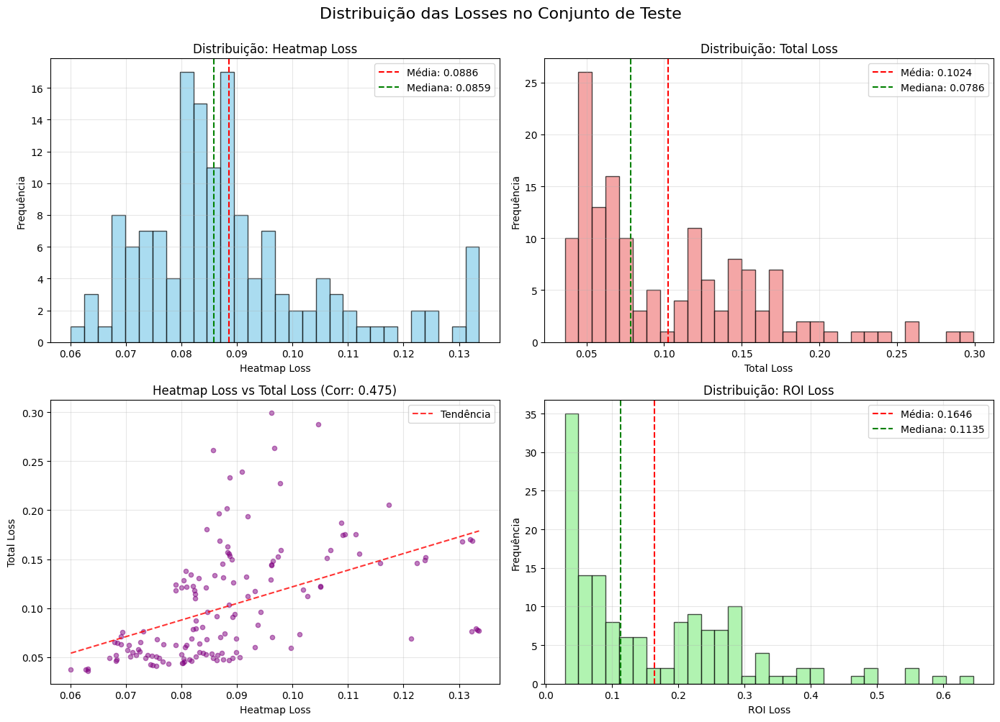

✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold1\keypoint_analysis.png


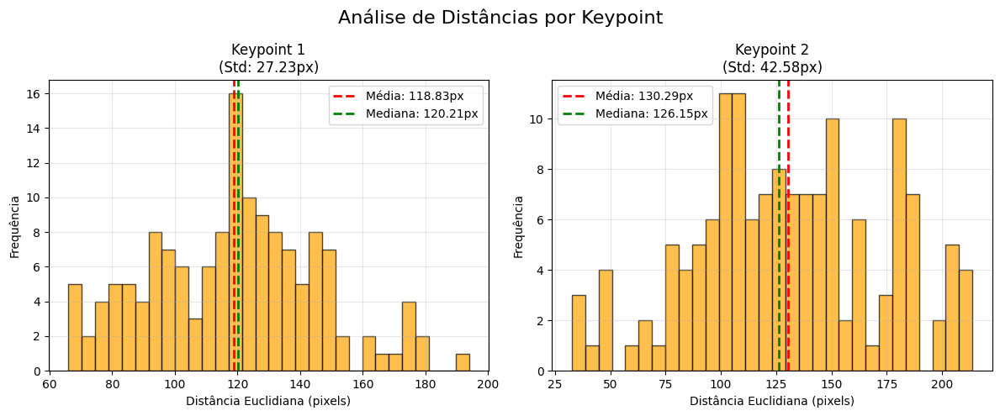


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold1\predictions_by_distance_keypoint1.png


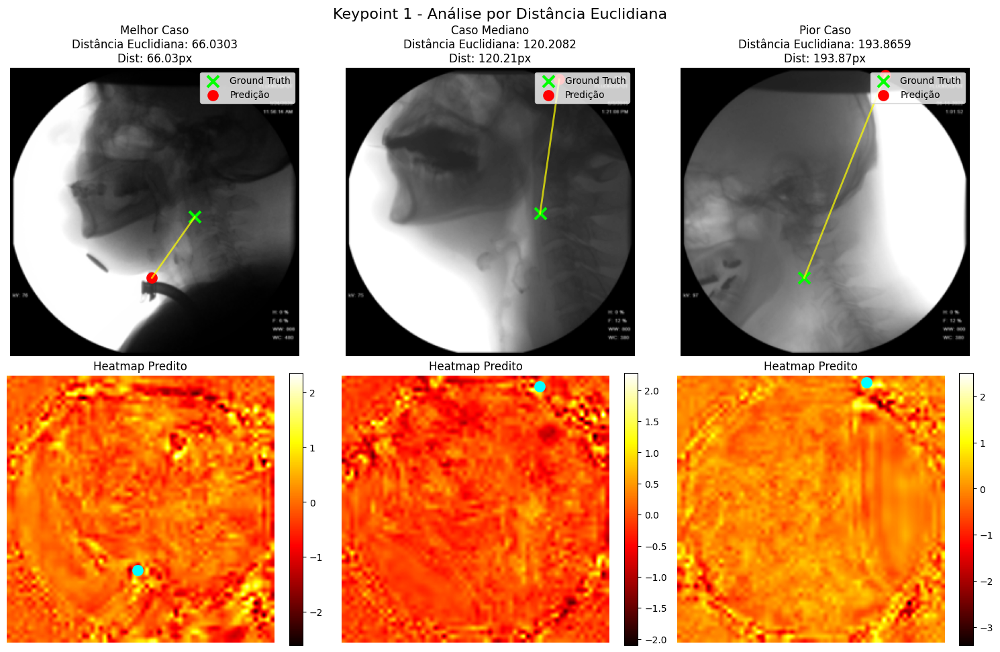


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold1\predictions_by_distance_keypoint2.png


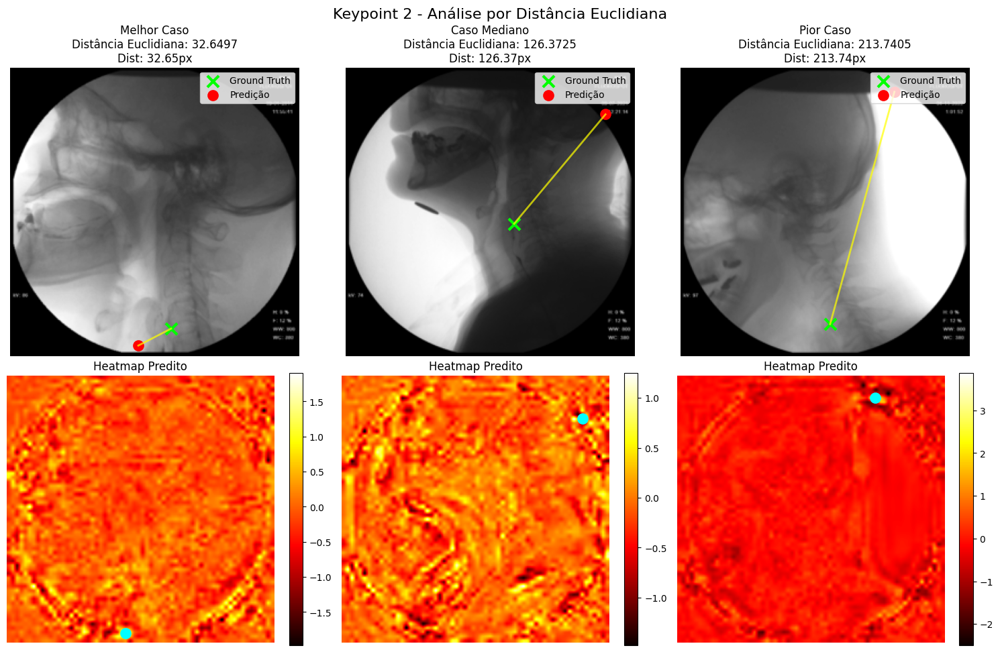


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold1\predictions_by_loss_keypoint1.png


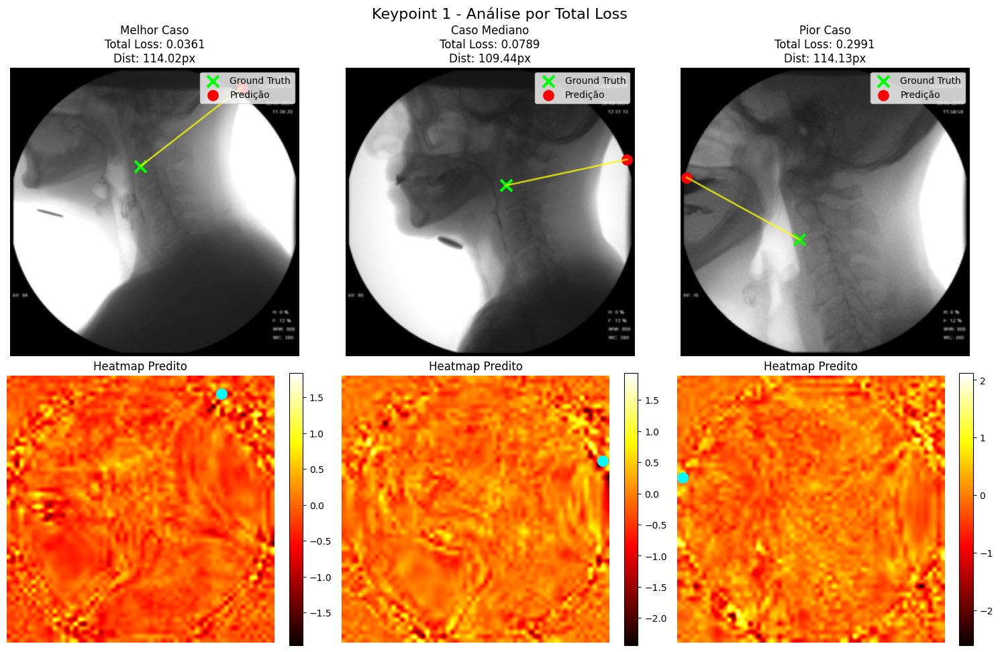


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold1\predictions_by_loss_keypoint2.png


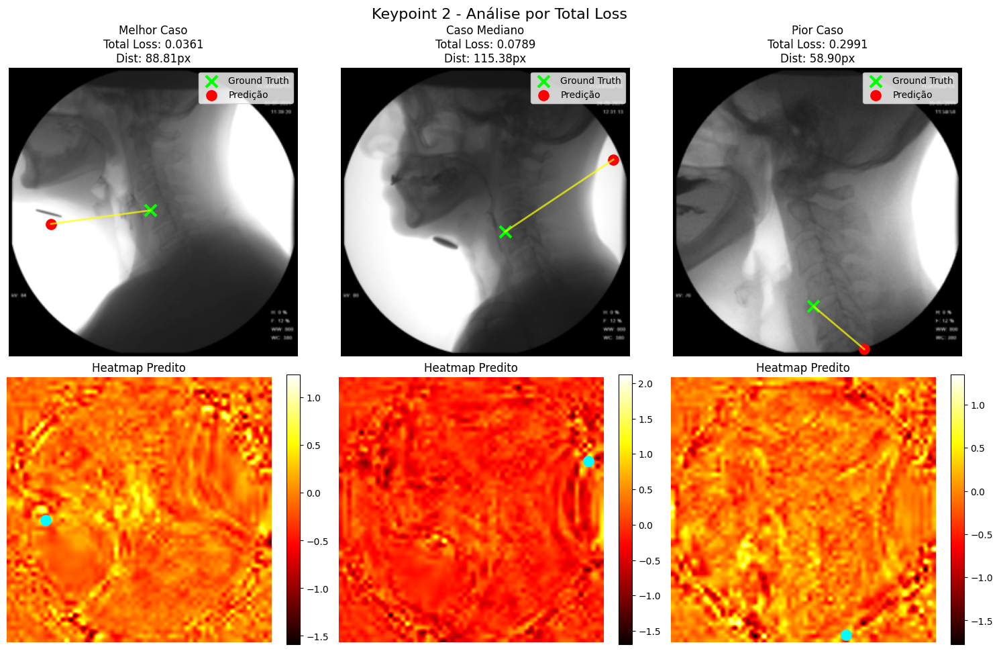

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.102395
Mediana:  0.078621
Std:      0.057551
Min:      0.036095
Max:      0.299085

----------------------------------------------------------------------
HEATMAP LOSS
----------------------------------------------------------------------
Média:    0.088585
Mediana:  0.085885
Std:      0.016109

----------------------------------------------------------------------
ROI LOSS
----------------------------------------------------------------------
Média:    0.164645
Mediana:  0.113522
Std:      0.133551

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    118.83
Mediana:  120.21
Std:      27.23
Min:      66.03
Max:    

Avaliando: 100%|██████████| 146/146 [00:23<00:00,  6.12it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold2\loss_distributions.png


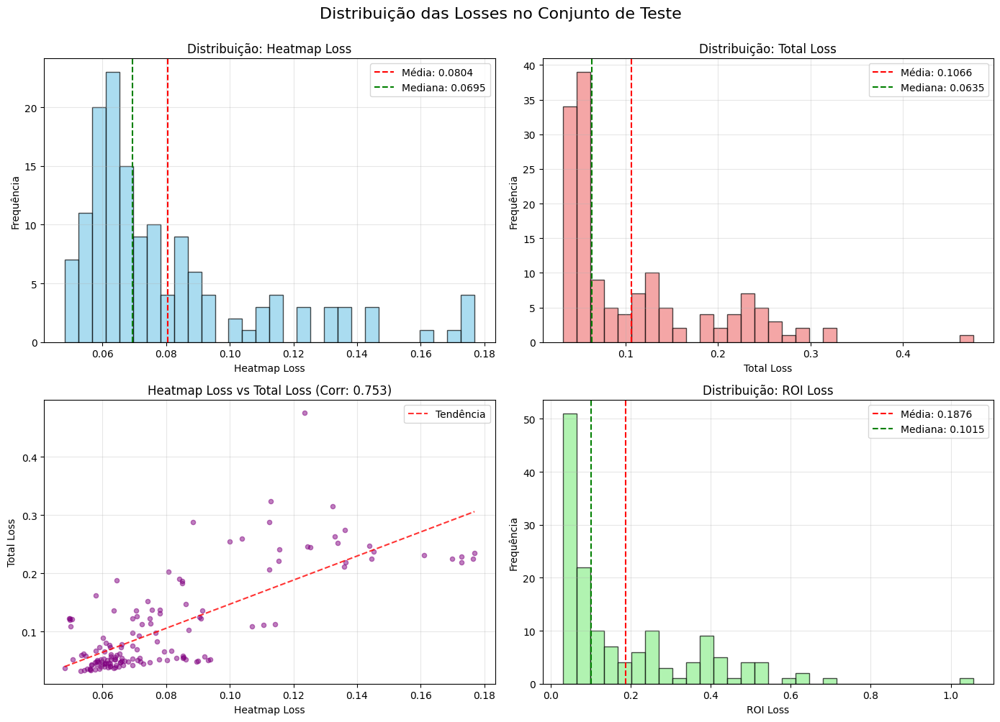

✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold2\keypoint_analysis.png


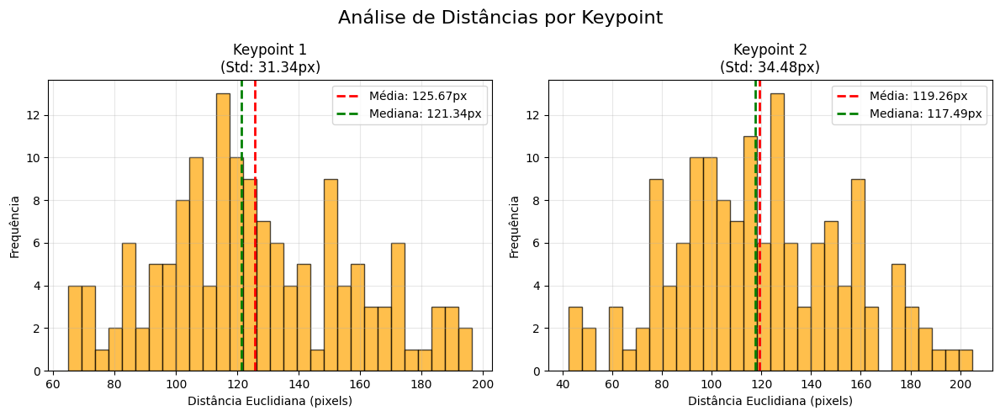


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold2\predictions_by_distance_keypoint1.png


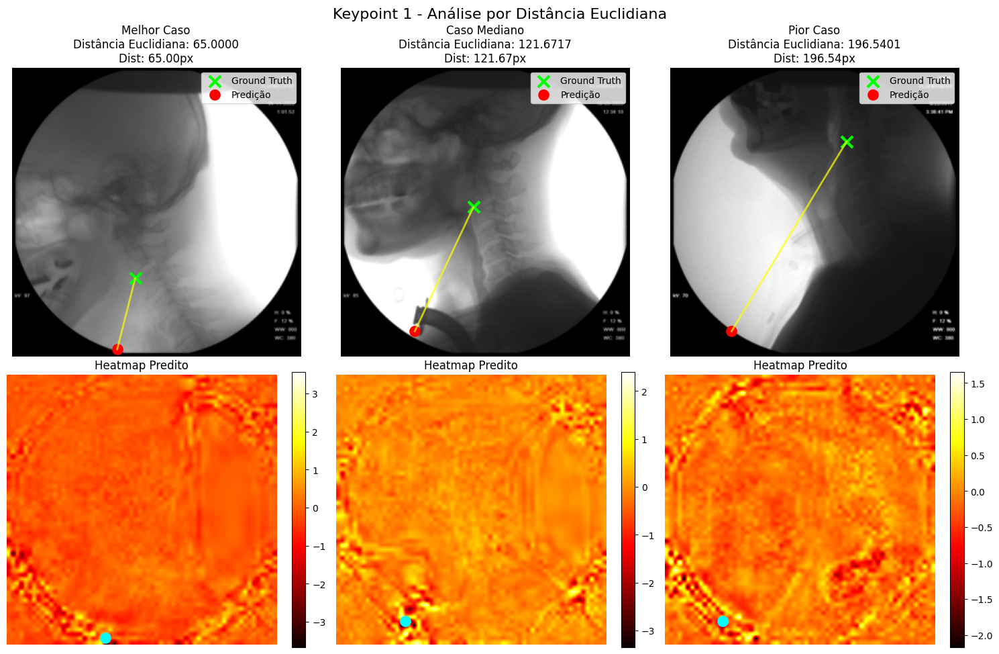


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold2\predictions_by_distance_keypoint2.png


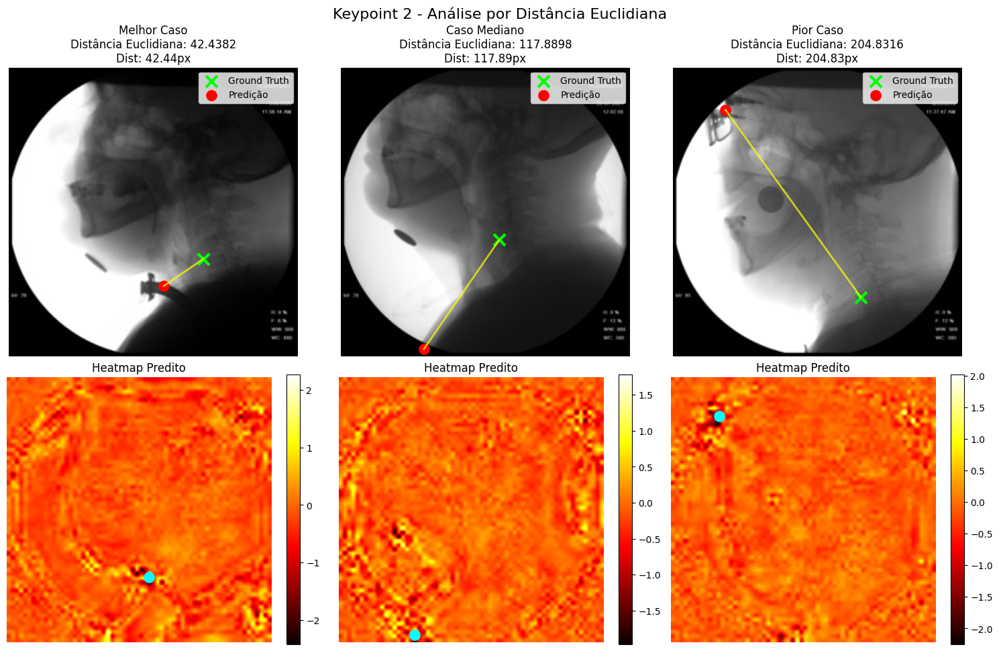


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold2\predictions_by_loss_keypoint1.png


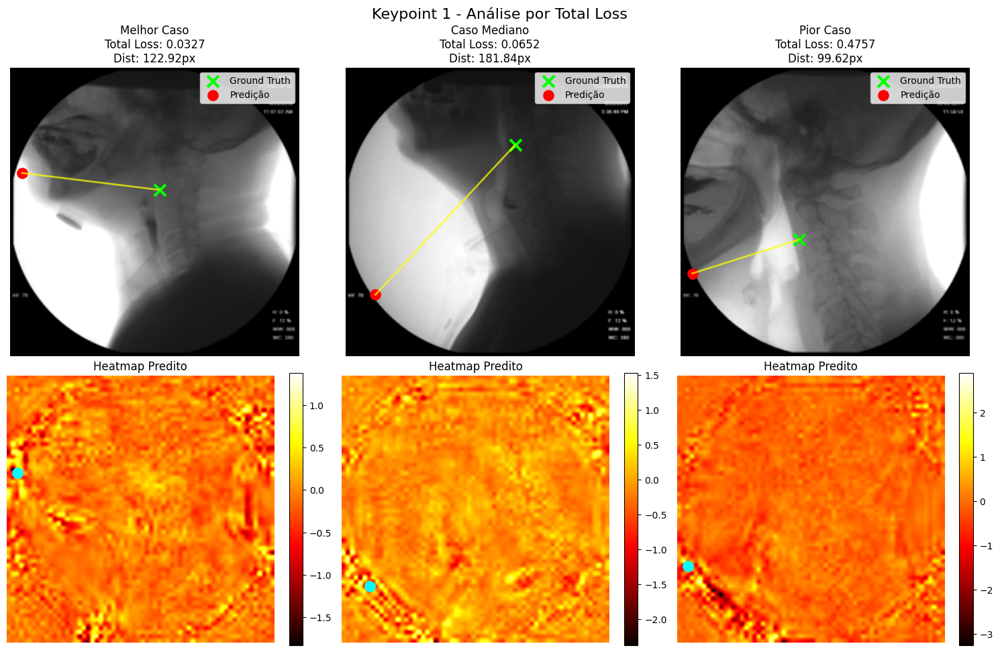


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold2\predictions_by_loss_keypoint2.png


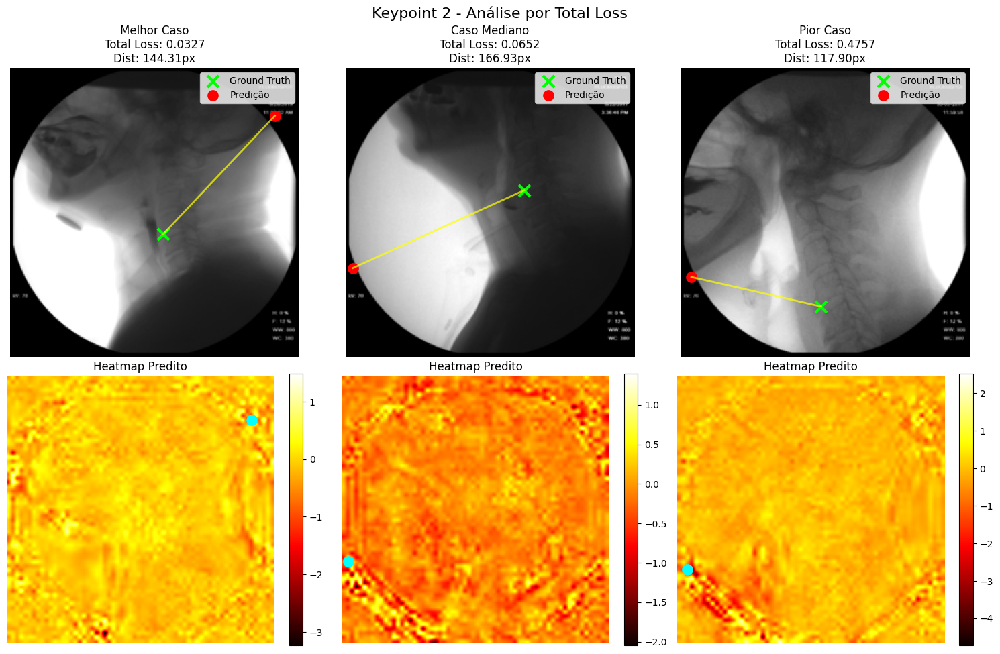

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.106643
Mediana:  0.063509
Std:      0.081918
Min:      0.032653
Max:      0.475651

----------------------------------------------------------------------
HEATMAP LOSS
----------------------------------------------------------------------
Média:    0.080445
Mediana:  0.069497
Std:      0.029807

----------------------------------------------------------------------
ROI LOSS
----------------------------------------------------------------------
Média:    0.187627
Mediana:  0.101474
Std:      0.178380

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    125.67
Mediana:  121.34
Std:      31.34
Min:      65.00
Max:    

Avaliando: 100%|██████████| 146/146 [00:23<00:00,  6.25it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold3\loss_distributions.png


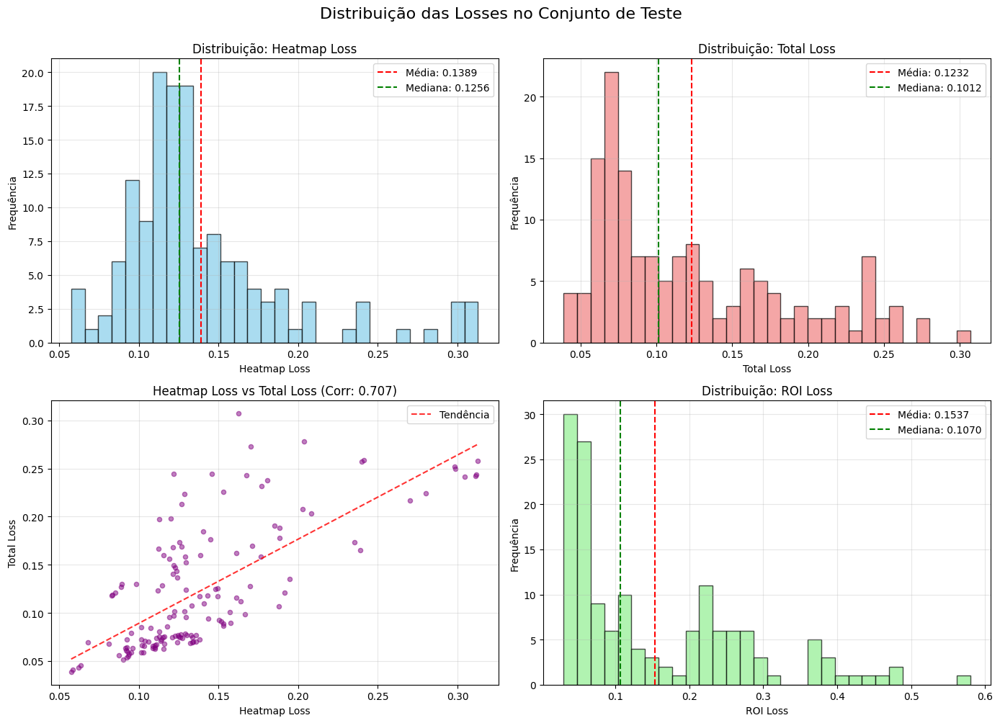

✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold3\keypoint_analysis.png


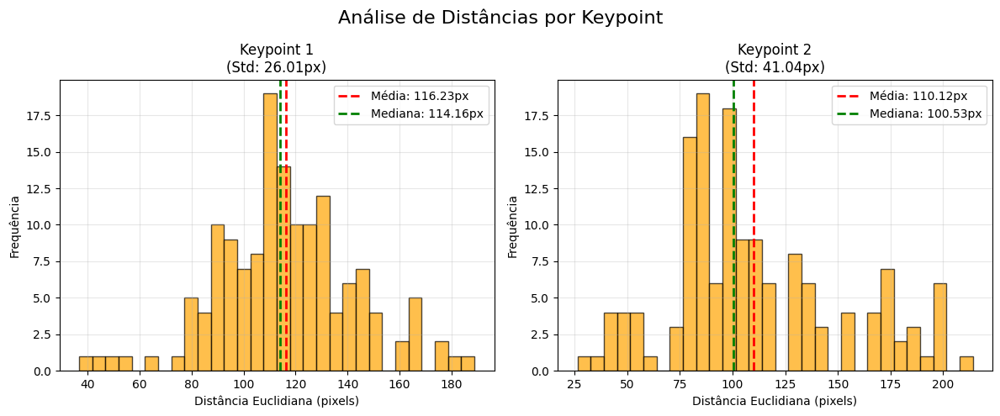


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold3\predictions_by_distance_keypoint1.png


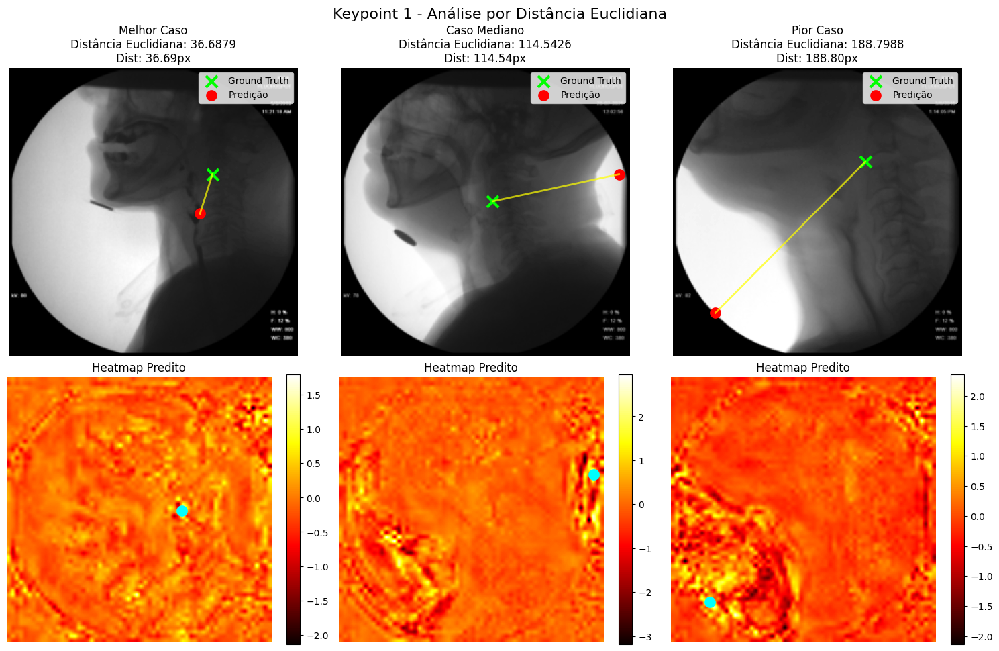


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold3\predictions_by_distance_keypoint2.png


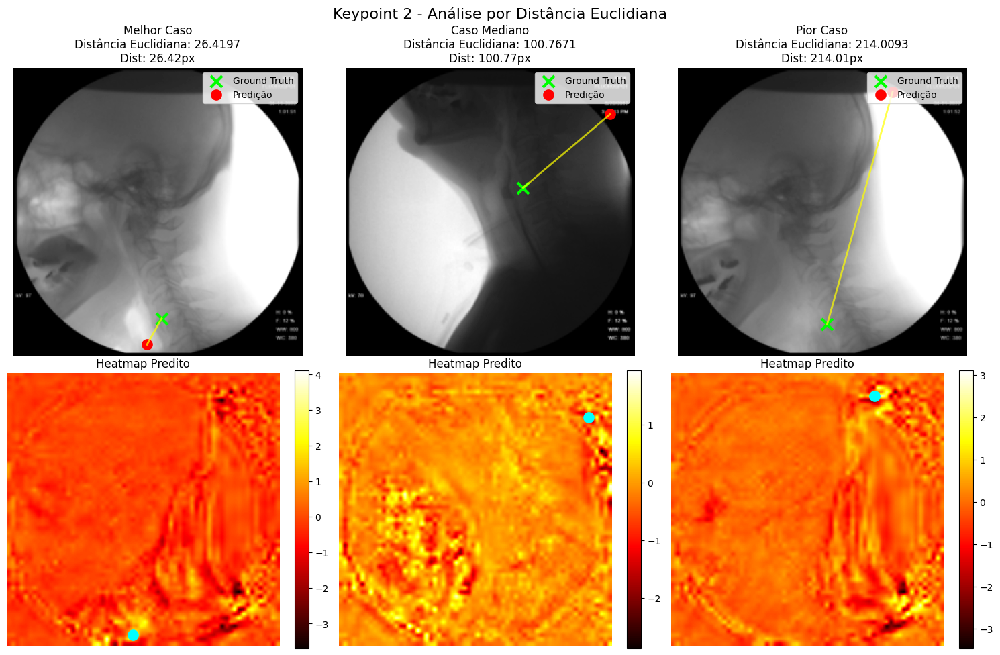


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold3\predictions_by_loss_keypoint1.png


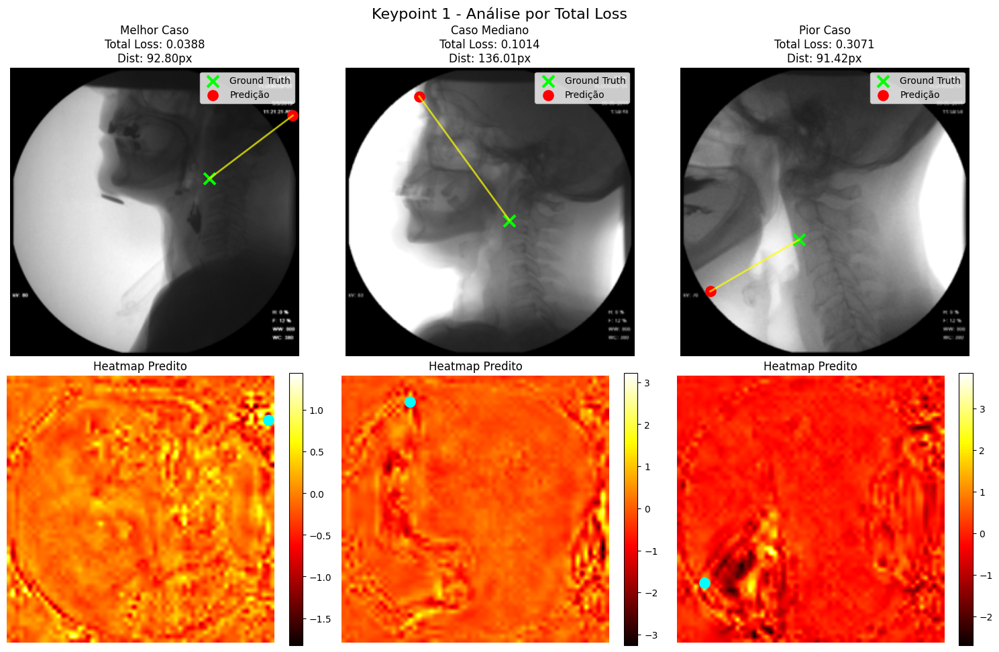


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold3\predictions_by_loss_keypoint2.png


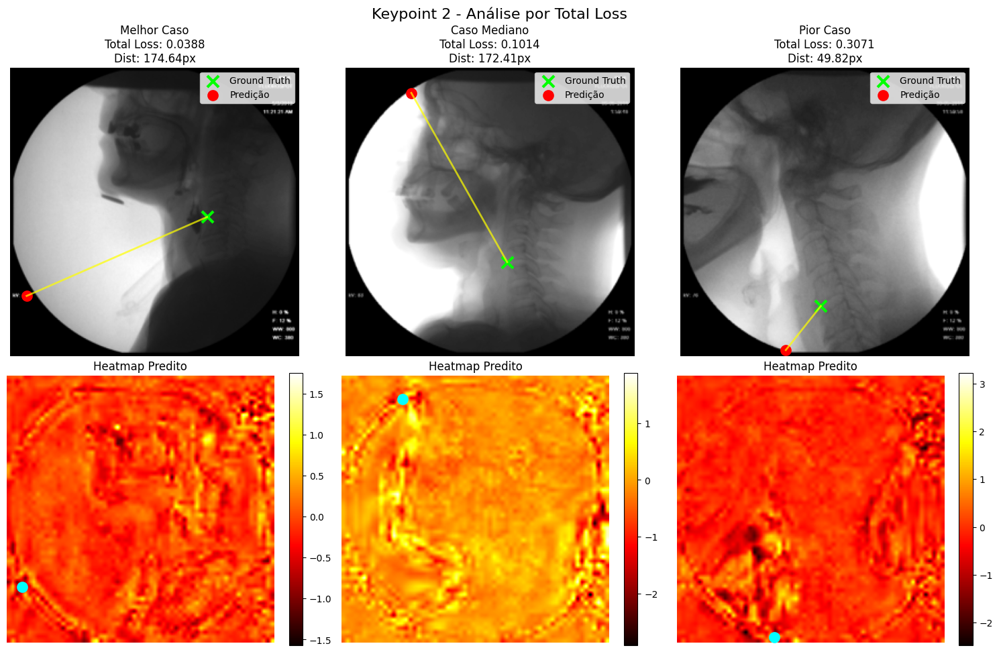

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.123157
Mediana:  0.101175
Std:      0.064372
Min:      0.038806
Max:      0.307090

----------------------------------------------------------------------
HEATMAP LOSS
----------------------------------------------------------------------
Média:    0.138891
Mediana:  0.125594
Std:      0.052099

----------------------------------------------------------------------
ROI LOSS
----------------------------------------------------------------------
Média:    0.153741
Mediana:  0.106959
Std:      0.122254

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    116.23
Mediana:  114.16
Std:      26.01
Min:      36.69
Max:    

Avaliando: 100%|██████████| 146/146 [00:23<00:00,  6.14it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold4\loss_distributions.png


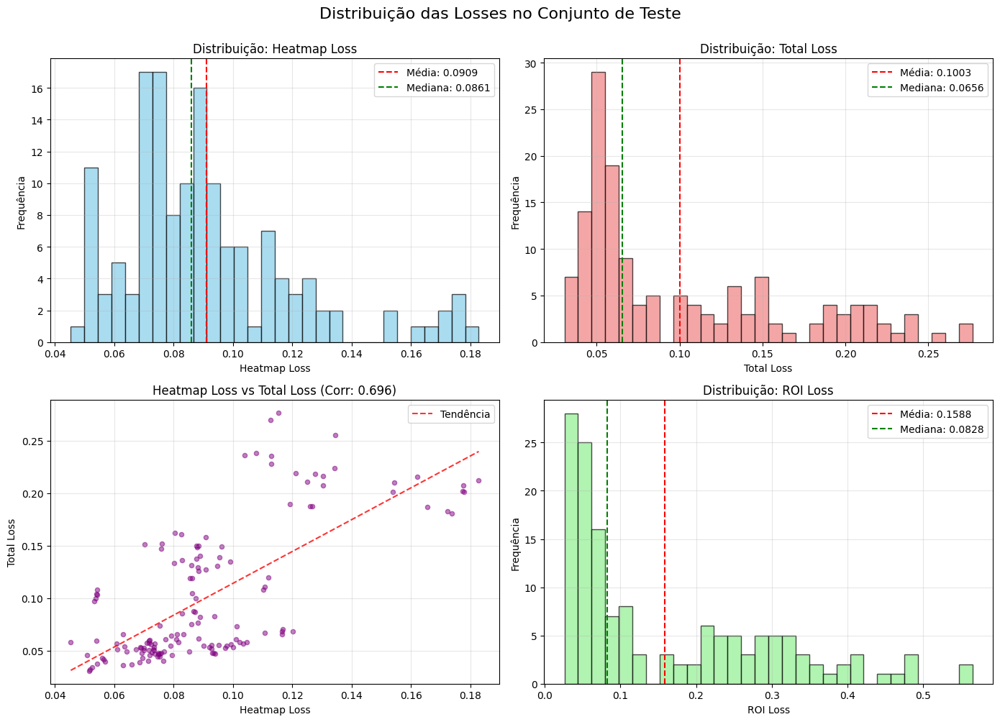

✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold4\keypoint_analysis.png


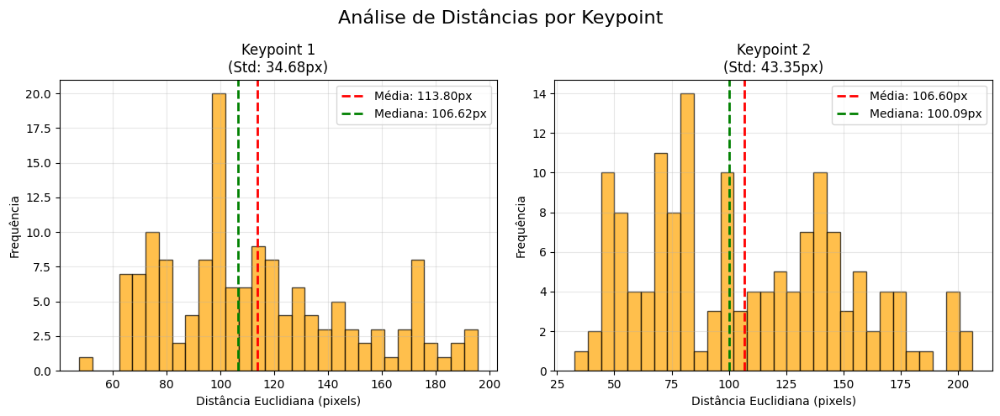


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold4\predictions_by_distance_keypoint1.png


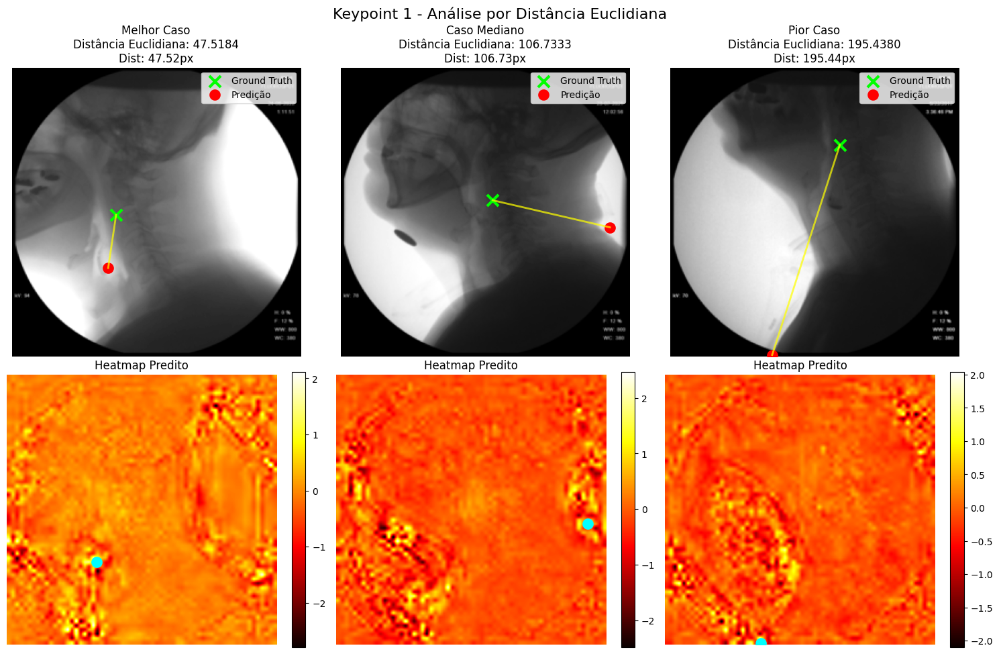


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold4\predictions_by_distance_keypoint2.png


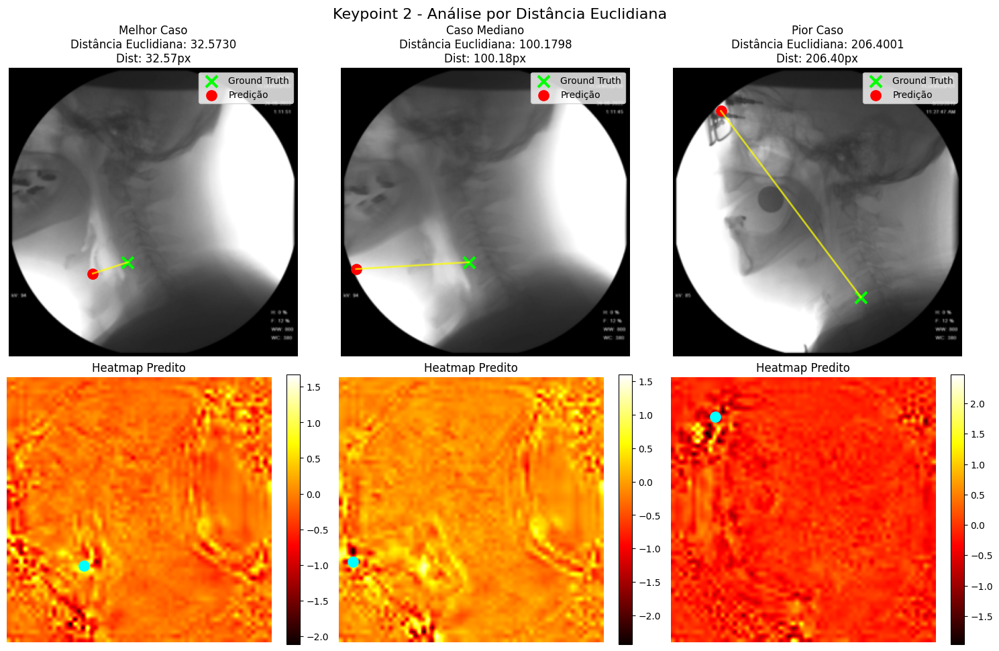


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold4\predictions_by_loss_keypoint1.png


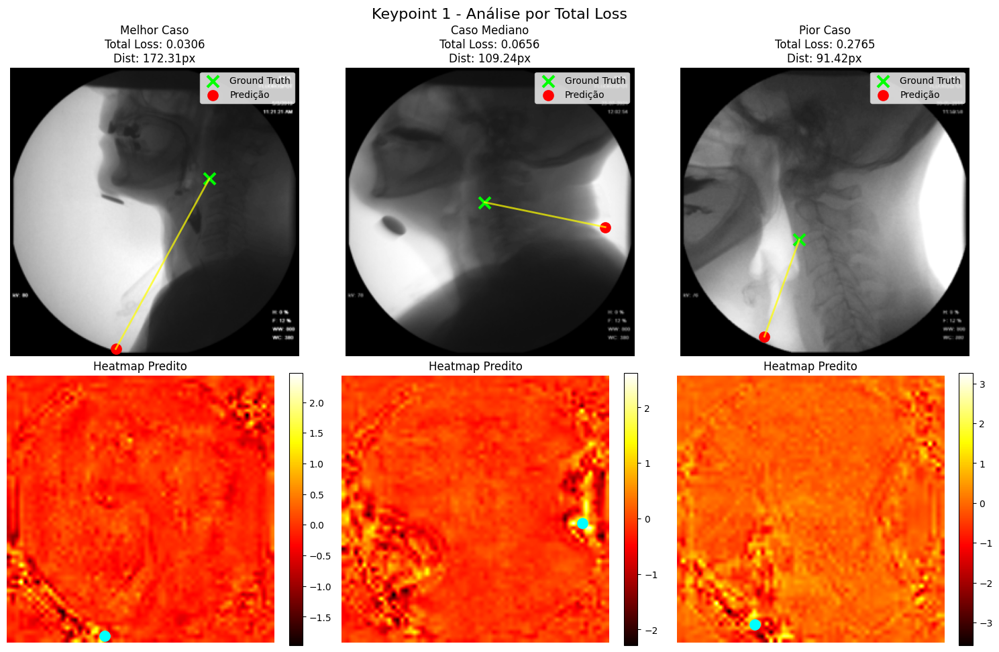


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold4\predictions_by_loss_keypoint2.png


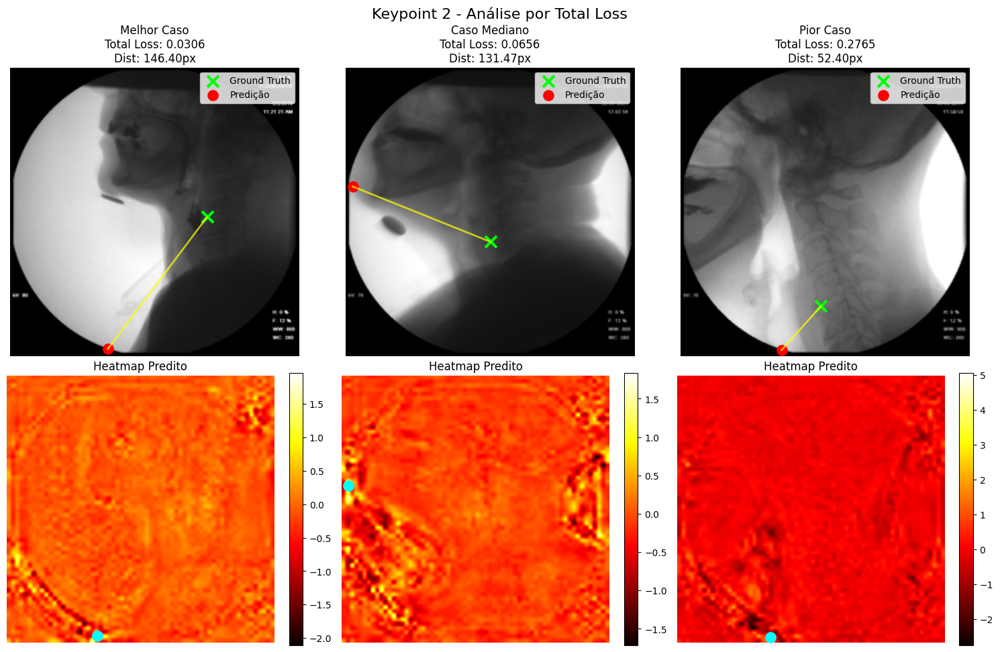

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.100325
Mediana:  0.065588
Std:      0.063851
Min:      0.030619
Max:      0.276521

----------------------------------------------------------------------
HEATMAP LOSS
----------------------------------------------------------------------
Média:    0.090948
Mediana:  0.086088
Std:      0.029256

----------------------------------------------------------------------
ROI LOSS
----------------------------------------------------------------------
Média:    0.158821
Mediana:  0.082839
Std:      0.135781

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    113.80
Mediana:  106.62
Std:      34.68
Min:      47.52
Max:    

Avaliando: 100%|██████████| 146/146 [00:23<00:00,  6.30it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold5\loss_distributions.png


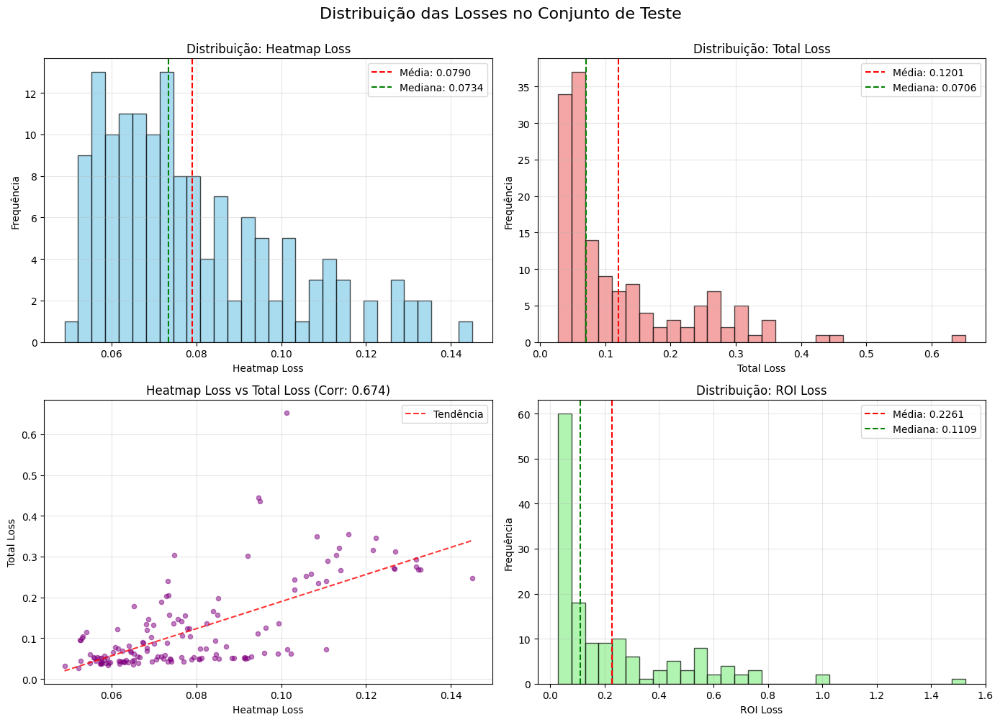

✓ Gráfico salvo: ..\..\figs\hrnet\MSELossRoi_200ep\fold5\keypoint_analysis.png


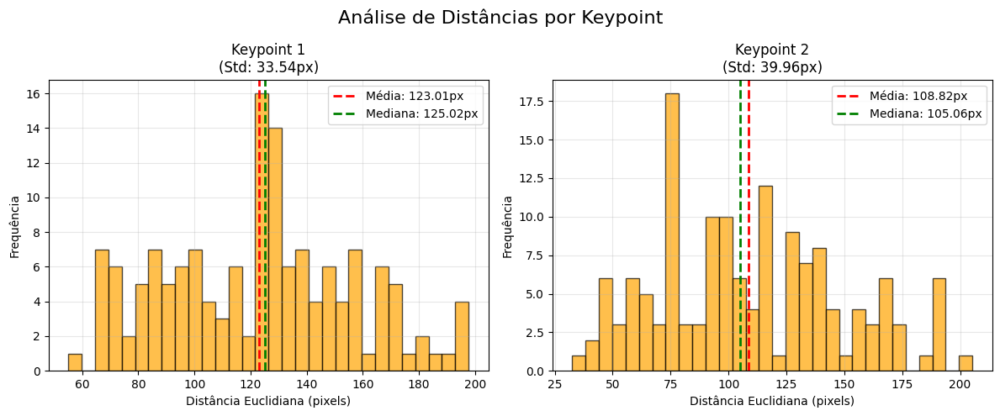


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold5\predictions_by_distance_keypoint1.png


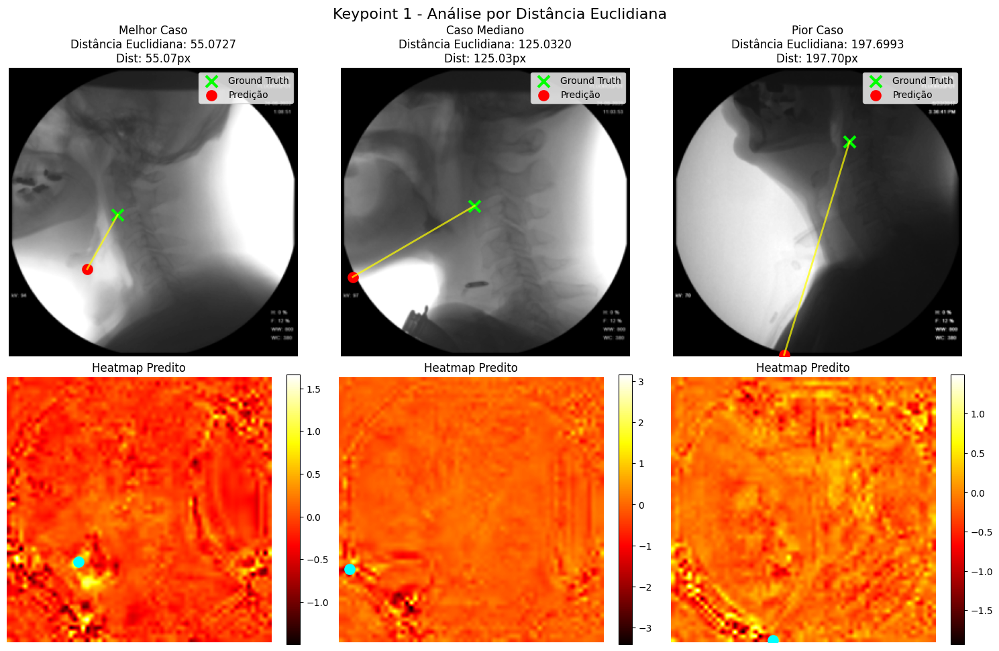


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold5\predictions_by_distance_keypoint2.png


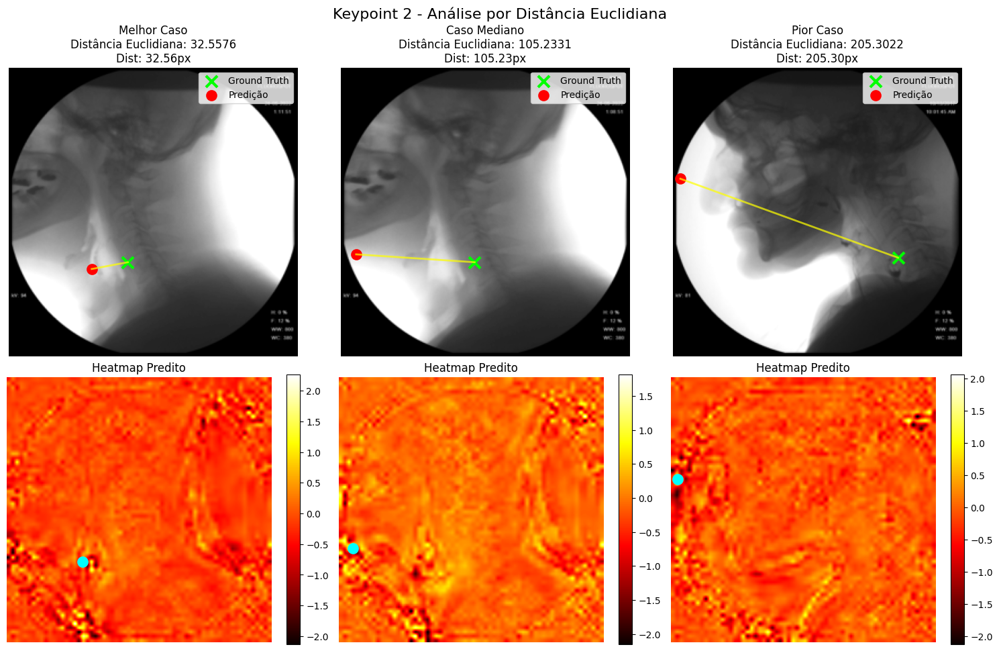


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold5\predictions_by_loss_keypoint1.png


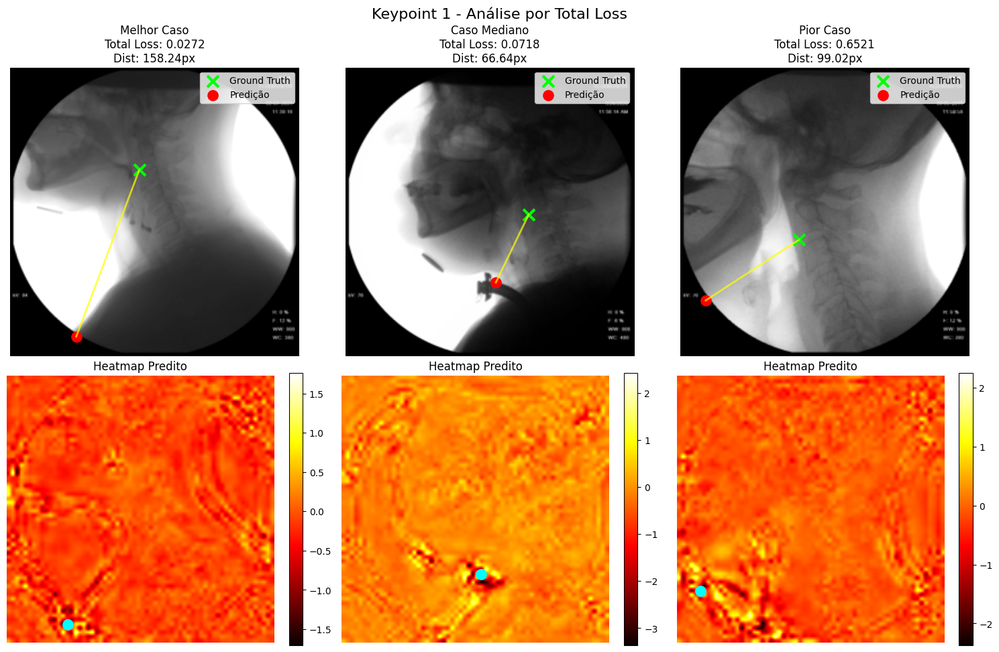


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\hrnet\MSELossRoi_200ep\fold5\predictions_by_loss_keypoint2.png


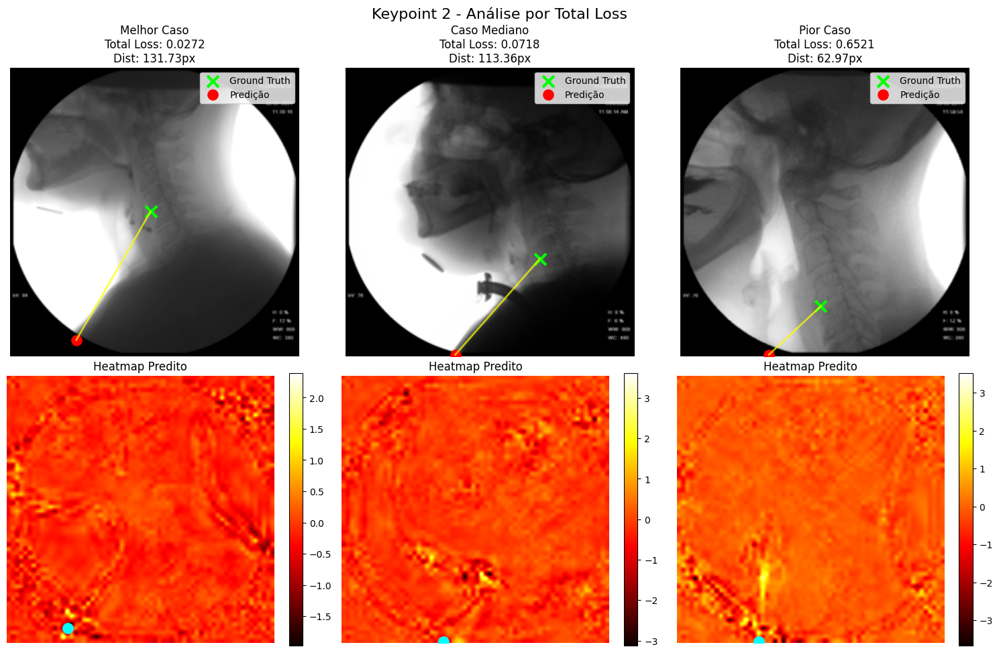

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.120111
Mediana:  0.070613
Std:      0.105166
Min:      0.027151
Max:      0.652137

----------------------------------------------------------------------
HEATMAP LOSS
----------------------------------------------------------------------
Média:    0.079049
Mediana:  0.073400
Std:      0.021333

----------------------------------------------------------------------
ROI LOSS
----------------------------------------------------------------------
Média:    0.226148
Mediana:  0.110926
Std:      0.245118

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    123.01
Mediana:  125.02
Std:      33.54
Min:      55.07
Max:    

In [16]:
# APLICAÇÃO - TESTE
# ============================================================================

for fold_idx in range(len(list_df_folds)):

    # Carrega melhor modelo de cada fold
    checkpoint_path = f"..\\..\\data\\model_weights\\hrnet\\{name_run}\\fold_{fold_idx+1}_best.pth"
    
    # Cria dataset de teste
    test_dataset = VFSSImageDataset(
        video_frame_df=df_test,
        target="heatmap+roi+points",
        output_dim=(256, 256),
        sigma = sigma_heatmap
    )
    
    model_kwargs = {
        "num_keypoints": 2,
    }

    # Executa avaliação completa
    results = evaluate_model_on_test(
        model_class=HRNet,
        model_kwargs=model_kwargs,
        checkpoint_path=checkpoint_path,
        test_dataset=test_dataset,
        config=config,
        modify_input_fn=modify_input,
        output_dir=f"..\\..\\figs\\hrnet\\{name_run}\\fold{fold_idx+1}"
    )
    